<a href="https://colab.research.google.com/github/Palermo01/projectDemo/blob/master/ejercicio_tres_m3p1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **L E N G U A J E   D E   S E Ñ A S**


Para el tercer ejercicio se proporciona una tabla que contiene imágenes de, 28 X 28, lenguaje de señas, donde los gestos de la mano muestran la representación de la A a la Z.

In [ ]:
!pip install watermark

In [ ]:
%load_ext watermark
%watermark

The watermark extension is already loaded. To reload it, use:
  %reload_ext watermark
Last updated: 2025-10-30T19:24:05.804596+00:00

Python implementation: CPython
Python version       : 3.12.12
IPython version      : 7.34.0

Compiler    : GCC 11.4.0
OS          : Linux
Release     : 6.6.105+
Machine     : x86_64
Processor   : x86_64
CPU cores   : 2
Architecture: 64bit



# Bibliotecas básicas

In [ ]:
import numpy as np
import pandas as pd
import warnings

In [ ]:
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
from math import ceil
plt.rcParams['figure.figsize'] = (12,12)
plt.rcParams['font.size'] = 16

warnings.filterwarnings('ignore')

# Datos

In [ ]:
data_path = '/content/data_practica_lenguaje_señas.csv'

senias = pd.read_csv(data_path)
lenguaje = senias.copy()

### _Funciones_

In [ ]:
pd.set_option('display.max_columns', None)

In [ ]:
def data_descripcion(df):
    print("Cantidad de filas:", df.shape[0])
    print("Cantidad de columnas:", df.shape[1])

    print("\nRegistros duplicados:", df.duplicated().sum())

    print("\nVariables:", df.columns.tolist())

    print("\nCantidad de valores ausentes en el dataframe:", df.isnull().sum().values.sum())

    print("\nValores únicos por columna:\n")
    unicos = df.nunique().to_frame(name='Valores Únicos')
    return unicos.T

In [ ]:
def valores_ausentes(dataframe):
    if dataframe.empty:
        print("El DataFrame está vacío, no hay datos para analizar.")
        return pd.DataFrame()
    print(f"Registros: {len(dataframe)}\n")

    cantidad_ausentes = dataframe.isnull().sum()
    porcentaje_ausentes = (cantidad_ausentes / len(dataframe)) * 100
    tipos_de_datos = dataframe.dtypes

    resumen_ausentes = pd.DataFrame({
        'Cantidad Ausentes': cantidad_ausentes,
        'Porcentaje Ausentes (%)': porcentaje_ausentes,
        'Tipo de Dato': tipos_de_datos
    })

    resumen_ausentes = resumen_ausentes.sort_values(by='Porcentaje Ausentes (%)', ascending=False)

    # DataFrame filtrado
    resumen_ausentes_filtrado = resumen_ausentes[resumen_ausentes['Cantidad Ausentes'] > 0]

    #print(resumen_ausentes_filtrado)

    return resumen_ausentes_filtrado

In [ ]:
def barras_horizontales(df: pd.DataFrame, columna: str, titulo: str):
    frecuencia = df[columna].value_counts()

    colores_pastel = plt.get_cmap('Pastel1', len(frecuencia))
    plt.figure(figsize=(22, 17))
    bars = plt.barh(frecuencia.index, frecuencia.values, color=colores_pastel.colors)

    for bar in bars:
        ancho = bar.get_width()
        plt.text(ancho, bar.get_y() + bar.get_height()/2,
                 f'{ancho}', va='center', ha='left', fontsize=10)

    plt.title(titulo, fontsize=16)
    plt.xlabel('Frecuencia', fontsize=10)
    plt.ylabel(columna.replace('_', ' ').title(), fontsize=10)
    plt.gca().invert_yaxis()  # Invertir el eje Y
    plt.show()

In [ ]:
def variables_numericas(dataframe):
    columnas_numericas = dataframe.select_dtypes(include=['number']).columns.tolist()
    columnas_no_numericas = dataframe.select_dtypes(exclude=['number']).columns.tolist()

    return columnas_numericas, columnas_no_numericas

In [ ]:
def info_var(dataframe):
    pd.set_option('display.max_columns', None)
    for col_nombre in dataframe.columns:
        print(f"--- Información para la columna: {col_nombre} ---")
        print("\nDescripción:")
        print(dataframe[col_nombre].describe())
        print("\nValores únicos:")
        print(dataframe[col_nombre].unique())
        print("\n" + "="*50 + "\n")

In [ ]:
def visualizar_histogramas_numericos(df_seleccionado: pd.DataFrame):
    variables_numericas = df_seleccionado.select_dtypes(include=['number']).columns[:34]
    num_vars = len(variables_numericas)

    if num_vars == 0:
        print("El DataFrame no contiene variables numéricas para visualizar.")
        return

    filas = ceil(num_vars / 6)
    columnas = 4
    fig, axes = plt.subplots(filas, columnas, figsize=(18, 5 * filas))
    axes = axes.flatten()
    paleta_pastel = sns.color_palette("pastel")

    # Histogramas
    for i, col in enumerate(variables_numericas):
        color_actual = paleta_pastel[i % len(paleta_pastel)]

        sns.histplot(
            df_seleccionado[col],
            bins=20,
            kde=True,
            ax=axes[i],
            color=color_actual,
            edgecolor='black'
        )

        axes[i].set_title(f'Distribución de: {col}', fontsize=10)
        axes[i].set_xlabel('')
        axes[i].set_ylabel('')

    for j in range(num_vars, filas * columnas):
        fig.delaxes(axes[j])

    plt.tight_layout(pad=3.0)
    plt.show()

In [ ]:
def optimizar_enteros(df: pd.DataFrame) -> pd.DataFrame:
    tipos_enteros = [
        ('Int8', -128, 127),
        ('Int16', -32768, 32767),
        ('Int32', -2147483648, 2147483647),
        ('Int64', -9223372036854775808, 9223372036854775807)
    ]

    columnas_enteras = df.select_dtypes(include=['int']).columns

    for col in columnas_enteras:
        min_val = df[col].min()
        max_val = df[col].max()

        convertido = False

        for dtype, min_limit, max_limit in tipos_enteros:
            if min_val >= min_limit and max_val <= max_limit:
                if df[col].dtype != dtype:
                    df[col] = df[col].astype(dtype)
                convertido = True
                break

    return df

# Descripción del dataset

---



In [ ]:
data_descripcion(lenguaje)

Cantidad de filas: 7172
Cantidad de columnas: 785

Registros duplicados: 0

Variables: ['label', 'pixel1', 'pixel2', 'pixel3', 'pixel4', 'pixel5', 'pixel6', 'pixel7', 'pixel8', 'pixel9', 'pixel10', 'pixel11', 'pixel12', 'pixel13', 'pixel14', 'pixel15', 'pixel16', 'pixel17', 'pixel18', 'pixel19', 'pixel20', 'pixel21', 'pixel22', 'pixel23', 'pixel24', 'pixel25', 'pixel26', 'pixel27', 'pixel28', 'pixel29', 'pixel30', 'pixel31', 'pixel32', 'pixel33', 'pixel34', 'pixel35', 'pixel36', 'pixel37', 'pixel38', 'pixel39', 'pixel40', 'pixel41', 'pixel42', 'pixel43', 'pixel44', 'pixel45', 'pixel46', 'pixel47', 'pixel48', 'pixel49', 'pixel50', 'pixel51', 'pixel52', 'pixel53', 'pixel54', 'pixel55', 'pixel56', 'pixel57', 'pixel58', 'pixel59', 'pixel60', 'pixel61', 'pixel62', 'pixel63', 'pixel64', 'pixel65', 'pixel66', 'pixel67', 'pixel68', 'pixel69', 'pixel70', 'pixel71', 'pixel72', 'pixel73', 'pixel74', 'pixel75', 'pixel76', 'pixel77', 'pixel78', 'pixel79', 'pixel80', 'pixel81', 'pixel82', 'pixel83',

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,pixel11,pixel12,pixel13,pixel14,pixel15,pixel16,pixel17,pixel18,pixel19,pixel20,pixel21,pixel22,pixel23,pixel24,pixel25,pixel26,pixel27,pixel28,pixel29,pixel30,pixel31,pixel32,pixel33,pixel34,pixel35,pixel36,pixel37,pixel38,pixel39,pixel40,pixel41,pixel42,pixel43,pixel44,pixel45,pixel46,pixel47,pixel48,pixel49,pixel50,pixel51,pixel52,pixel53,pixel54,pixel55,pixel56,pixel57,pixel58,pixel59,pixel60,pixel61,pixel62,pixel63,pixel64,pixel65,pixel66,pixel67,pixel68,pixel69,pixel70,pixel71,pixel72,pixel73,pixel74,pixel75,pixel76,pixel77,pixel78,pixel79,pixel80,pixel81,pixel82,pixel83,pixel84,pixel85,pixel86,pixel87,pixel88,pixel89,pixel90,pixel91,pixel92,pixel93,pixel94,pixel95,pixel96,pixel97,pixel98,pixel99,pixel100,pixel101,pixel102,pixel103,pixel104,pixel105,pixel106,pixel107,pixel108,pixel109,pixel110,pixel111,pixel112,pixel113,pixel114,pixel115,pixel116,pixel117,pixel118,pixel119,pixel120,pixel121,pixel122,pixel123,pixel124,pixel125,pixel126,pixel127,pixel128,pixel129,pixel130,pixel131,pixel132,pixel133,pixel134,pixel135,pixel136,pixel137,pixel138,pixel139,pixel140,pixel141,pixel142,pixel143,pixel144,pixel145,pixel146,pixel147,pixel148,pixel149,pixel150,pixel151,pixel152,pixel153,pixel154,pixel155,pixel156,pixel157,pixel158,pixel159,pixel160,pixel161,pixel162,pixel163,pixel164,pixel165,pixel166,pixel167,pixel168,pixel169,pixel170,pixel171,pixel172,pixel173,pixel174,pixel175,pixel176,pixel177,pixel178,pixel179,pixel180,pixel181,pixel182,pixel183,pixel184,pixel185,pixel186,pixel187,pixel188,pixel189,pixel190,pixel191,pixel192,pixel193,pixel194,pixel195,pixel196,pixel197,pixel198,pixel199,pixel200,pixel201,pixel202,pixel203,pixel204,pixel205,pixel206,pixel207,pixel208,pixel209,pixel210,pixel211,pixel212,pixel213,pixel214,pixel215,pixel216,pixel217,pixel218,pixel219,pixel220,pixel221,pixel222,pixel223,pixel224,pixel225,pixel226,pixel227,pixel228,pixel229,pixel230,pixel231,pixel232,pixel233,pixel234,pixel235,pixel236,pixel237,pixel238,pixel239,pixel240,pixel241,pixel242,pixel243,pixel244,pixel245,pixel246,pixel247,pixel248,pixel249,pixel250,pixel251,pixel252,pixel253,pixel254,pixel255,pixel256,pixel257,pixel258,pixel259,pixel260,pixel261,pixel262,pixel263,pixel264,pixel265,pixel266,pixel267,pixel268,pixel269,pixel270,pixel271,pixel272,pixel273,pixel274,pixel275,pixel276,pixel277,pixel278,pixel279,pixel280,pixel281,pixel282,pixel283,pixel284,pixel285,pixel286,pixel287,pixel288,pixel289,pixel290,pixel291,pixel292,pixel293,pixel294,pixel295,pixel296,pixel297,pixel298,pixel299,pixel300,pixel301,pixel302,pixel303,pixel304,pixel305,pixel306,pixel307,pixel308,pixel309,pixel310,pixel311,pixel312,pixel313,pixel314,pixel315,pixel316,pixel317,pixel318,pixel319,pixel320,pixel321,pixel322,pixel323,pixel324,pixel325,pixel326,pixel327,pixel328,pixel329,pixel330,pixel331,pixel332,pixel333,pixel334,pixel335,pixel336,pixel337,pixel338,pixel339,pixel340,pixel341,pixel342,pixel343,pixel344,pixel345,pixel346,pixel347,pixel348,pixel349,pixel350,pixel351,pixel352,pixel353,pixel354,pixel355,pixel356,pixel357,pixel358,pixel359,pixel360,pixel361,pixel362,pixel363,pixel364,pixel365,pixel366,pixel367,pixel368,pixel369,pixel370,pixel371,pixel372,pixel373,pixel374,pixel375,pixel376,pixel377,pixel378,pixel379,pixel380,pixel381,pixel382,pixel383,pixel384,pixel385,pixel386,pixel387,pixel388,pixel389,pixel390,pixel391,pixel392,pixel393,pixel394,pixel395,pixel396,pixel397,pixel398,pixel399,pixel400,pixel401,pixel402,pixel403,pixel404,pixel405,pixel406,pixel407,pixel408,pixel409,pixel410,pixel411,pixel412,pixel413,pixel414,pixel415,pixel416,pixel417,pixel418,pixel419,pixel420,pixel421,pixel422,pixel423,pixel424,pixel425,pixel426,pixel427,pixel428,pixel429,pixel430,pixel431,pixel432,pixel433,pixel434,pixel435,pixel436,pixel437,pixel438,pixel439,pixel440,pixel441,pixel442,pixel443,pixel444,pixel445,pixel446,pixel447,pixel448,pixel449,pixel450,pixel451,pixel452,pixel453,pixel454,pixel455,pixel4

**Dimensiones del dataframe**

In [ ]:
lenguaje.shape

(7172, 785)

# Valores ausentes

In [ ]:
valores_ausentes(lenguaje)

Registros: 7172



,Cantidad Ausentes,Porcentaje Ausentes (%),Tipo de Dato


In [ ]:
solo_var_con_ausentes = lenguaje.loc[:, (lenguaje.isnull().sum() > 0)].columns.tolist()

# Tabla y tipos de datos

In [ ]:
lenguaje.head(3)

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,pixel11,pixel12,pixel13,pixel14,pixel15,pixel16,pixel17,pixel18,pixel19,pixel20,pixel21,pixel22,pixel23,pixel24,pixel25,pixel26,pixel27,pixel28,pixel29,pixel30,pixel31,pixel32,pixel33,pixel34,pixel35,pixel36,pixel37,pixel38,pixel39,pixel40,pixel41,pixel42,pixel43,pixel44,pixel45,pixel46,pixel47,pixel48,pixel49,pixel50,pixel51,pixel52,pixel53,pixel54,pixel55,pixel56,pixel57,pixel58,pixel59,pixel60,pixel61,pixel62,pixel63,pixel64,pixel65,pixel66,pixel67,pixel68,pixel69,pixel70,pixel71,pixel72,pixel73,pixel74,pixel75,pixel76,pixel77,pixel78,pixel79,pixel80,pixel81,pixel82,pixel83,pixel84,pixel85,pixel86,pixel87,pixel88,pixel89,pixel90,pixel91,pixel92,pixel93,pixel94,pixel95,pixel96,pixel97,pixel98,pixel99,pixel100,pixel101,pixel102,pixel103,pixel104,pixel105,pixel106,pixel107,pixel108,pixel109,pixel110,pixel111,pixel112,pixel113,pixel114,pixel115,pixel116,pixel117,pixel118,pixel119,pixel120,pixel121,pixel122,pixel123,pixel124,pixel125,pixel126,pixel127,pixel128,pixel129,pixel130,pixel131,pixel132,pixel133,pixel134,pixel135,pixel136,pixel137,pixel138,pixel139,pixel140,pixel141,pixel142,pixel143,pixel144,pixel145,pixel146,pixel147,pixel148,pixel149,pixel150,pixel151,pixel152,pixel153,pixel154,pixel155,pixel156,pixel157,pixel158,pixel159,pixel160,pixel161,pixel162,pixel163,pixel164,pixel165,pixel166,pixel167,pixel168,pixel169,pixel170,pixel171,pixel172,pixel173,pixel174,pixel175,pixel176,pixel177,pixel178,pixel179,pixel180,pixel181,pixel182,pixel183,pixel184,pixel185,pixel186,pixel187,pixel188,pixel189,pixel190,pixel191,pixel192,pixel193,pixel194,pixel195,pixel196,pixel197,pixel198,pixel199,pixel200,pixel201,pixel202,pixel203,pixel204,pixel205,pixel206,pixel207,pixel208,pixel209,pixel210,pixel211,pixel212,pixel213,pixel214,pixel215,pixel216,pixel217,pixel218,pixel219,pixel220,pixel221,pixel222,pixel223,pixel224,pixel225,pixel226,pixel227,pixel228,pixel229,pixel230,pixel231,pixel232,pixel233,pixel234,pixel235,pixel236,pixel237,pixel238,pixel239,pixel240,pixel241,pixel242,pixel243,pixel244,pixel245,pixel246,pixel247,pixel248,pixel249,pixel250,pixel251,pixel252,pixel253,pixel254,pixel255,pixel256,pixel257,pixel258,pixel259,pixel260,pixel261,pixel262,pixel263,pixel264,pixel265,pixel266,pixel267,pixel268,pixel269,pixel270,pixel271,pixel272,pixel273,pixel274,pixel275,pixel276,pixel277,pixel278,pixel279,pixel280,pixel281,pixel282,pixel283,pixel284,pixel285,pixel286,pixel287,pixel288,pixel289,pixel290,pixel291,pixel292,pixel293,pixel294,pixel295,pixel296,pixel297,pixel298,pixel299,pixel300,pixel301,pixel302,pixel303,pixel304,pixel305,pixel306,pixel307,pixel308,pixel309,pixel310,pixel311,pixel312,pixel313,pixel314,pixel315,pixel316,pixel317,pixel318,pixel319,pixel320,pixel321,pixel322,pixel323,pixel324,pixel325,pixel326,pixel327,pixel328,pixel329,pixel330,pixel331,pixel332,pixel333,pixel334,pixel335,pixel336,pixel337,pixel338,pixel339,pixel340,pixel341,pixel342,pixel343,pixel344,pixel345,pixel346,pixel347,pixel348,pixel349,pixel350,pixel351,pixel352,pixel353,pixel354,pixel355,pixel356,pixel357,pixel358,pixel359,pixel360,pixel361,pixel362,pixel363,pixel364,pixel365,pixel366,pixel367,pixel368,pixel369,pixel370,pixel371,pixel372,pixel373,pixel374,pixel375,pixel376,pixel377,pixel378,pixel379,pixel380,pixel381,pixel382,pixel383,pixel384,pixel385,pixel386,pixel387,pixel388,pixel389,pixel390,pixel391,pixel392,pixel393,pixel394,pixel395,pixel396,pixel397,pixel398,pixel399,pixel400,pixel401,pixel402,pixel403,pixel404,pixel405,pixel406,pixel407,pixel408,pixel409,pixel410,pixel411,pixel412,pixel413,pixel414,pixel415,pixel416,pixel417,pixel418,pixel419,pixel420,pixel421,pixel422,pixel423,pixel424,pixel425,pixel426,pixel427,pixel428,pixel429,pixel430,pixel431,pixel432,pixel433,pixel434,pixel435,pixel436,pixel437,pixel438,pixel439,pixel440,pixel441,pixel442,pixel443,pixel444,pixel445,pixel446,pixel447,pixel448,pixel449,pixel450,pixel451,pixel452,pixel453,pixel454,pixel455,pixel4

In [ ]:
lenguaje.info()
# lenguaje.describe(include = "all")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7172 entries, 0 to 7171
Columns: 785 entries, label to pixel784
dtypes: int64(785)
memory usage: 43.0 MB


# Memoria

In [ ]:
print(lenguaje.memory_usage(deep = True))

Index         132
label       57376
pixel1      57376
pixel2      57376
pixel3      57376
            ...  
pixel780    57376
pixel781    57376
pixel782    57376
pixel783    57376
pixel784    57376
Length: 786, dtype: int64


In [ ]:
optimizar_enteros(lenguaje)

,label,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,pixel11,pixel12,pixel13,pixel14,pixel15,pixel16,pixel17,pixel18,pixel19,pixel20,pixel21,pixel22,pixel23,pixel24,pixel25,pixel26,pixel27,pixel28,pixel29,pixel30,pixel31,pixel32,pixel33,pixel34,pixel35,pixel36,pixel37,pixel38,pixel39,pixel40,pixel41,pixel42,pixel43,pixel44,pixel45,pixel46,pixel47,pixel48,pixel49,pixel50,pixel51,pixel52,pixel53,pixel54,pixel55,pixel56,pixel57,pixel58,pixel59,pixel60,pixel61,pixel62,pixel63,pixel64,pixel65,pixel66,pixel67,pixel68,pixel69,pixel70,pixel71,pixel72,pixel73,pixel74,pixel75,pixel76,pixel77,pixel78,pixel79,pixel80,pixel81,pixel82,pixel83,pixel84,pixel85,pixel86,pixel87,pixel88,pixel89,pixel90,pixel91,pixel92,pixel93,pixel94,pixel95,pixel96,pixel97,pixel98,pixel99,pixel100,pixel101,pixel102,pixel103,pixel104,pixel105,pixel106,pixel107,pixel108,pixel109,pixel110,pixel111,pixel112,pixel113,pixel114,pixel115,pixel116,pixel117,pixel118,pixel119,pixel120,pixel121,pixel122,pixel123,pixel124,pixel125,pixel126,pixel127,pixel128,pixel129,pixel130,pixel131,pixel132,pixel133,pixel134,pixel135,pixel136,pixel137,pixel138,pixel139,pixel140,pixel141,pixel142,pixel143,pixel144,pixel145,pixel146,pixel147,pixel148,pixel149,pixel150,pixel151,pixel152,pixel153,pixel154,pixel155,pixel156,pixel157,pixel158,pixel159,pixel160,pixel161,pixel162,pixel163,pixel164,pixel165,pixel166,pixel167,pixel168,pixel169,pixel170,pixel171,pixel172,pixel173,pixel174,pixel175,pixel176,pixel177,pixel178,pixel179,pixel180,pixel181,pixel182,pixel183,pixel184,pixel185,pixel186,pixel187,pixel188,pixel189,pixel190,pixel191,pixel192,pixel193,pixel194,pixel195,pixel196,pixel197,pixel198,pixel199,pixel200,pixel201,pixel202,pixel203,pixel204,pixel205,pixel206,pixel207,pixel208,pixel209,pixel210,pixel211,pixel212,pixel213,pixel214,pixel215,pixel216,pixel217,pixel218,pixel219,pixel220,pixel221,pixel222,pixel223,pixel224,pixel225,pixel226,pixel227,pixel228,pixel229,pixel230,pixel231,pixel232,pixel233,pixel234,pixel235,pixel236,pixel237,pixel238,pixel239,pixel240,pixel241,pixel242,pixel243,pixel244,pixel245,pixel246,pixel247,pixel248,pixel249,pixel250,pixel251,pixel252,pixel253,pixel254,pixel255,pixel256,pixel257,pixel258,pixel259,pixel260,pixel261,pixel262,pixel263,pixel264,pixel265,pixel266,pixel267,pixel268,pixel269,pixel270,pixel271,pixel272,pixel273,pixel274,pixel275,pixel276,pixel277,pixel278,pixel279,pixel280,pixel281,pixel282,pixel283,pixel284,pixel285,pixel286,pixel287,pixel288,pixel289,pixel290,pixel291,pixel292,pixel293,pixel294,pixel295,pixel296,pixel297,pixel298,pixel299,pixel300,pixel301,pixel302,pixel303,pixel304,pixel305,pixel306,pixel307,pixel308,pixel309,pixel310,pixel311,pixel312,pixel313,pixel314,pixel315,pixel316,pixel317,pixel318,pixel319,pixel320,pixel321,pixel322,pixel323,pixel324,pixel325,pixel326,pixel327,pixel328,pixel329,pixel330,pixel331,pixel332,pixel333,pixel334,pixel335,pixel336,pixel337,pixel338,pixel339,pixel340,pixel341,pixel342,pixel343,pixel344,pixel345,pixel346,pixel347,pixel348,pixel349,pixel350,pixel351,pixel352,pixel353,pixel354,pixel355,pixel356,pixel357,pixel358,pixel359,pixel360,pixel361,pixel362,pixel363,pixel364,pixel365,pixel366,pixel367,pixel368,pixel369,pixel370,pixel371,pixel372,pixel373,pixel374,pixel375,pixel376,pixel377,pixel378,pixel379,pixel380,pixel381,pixel382,pixel383,pixel384,pixel385,pixel386,pixel387,pixel388,pixel389,pixel390,pixel391,pixel392,pixel393,pixel394,pixel395,pixel396,pixel397,pixel398,pixel399,pixel400,pixel401,pixel402,pixel403,pixel404,pixel405,pixel406,pixel407,pixel408,pixel409,pixel410,pixel411,pixel412,pixel413,pixel414,pixel415,pixel416,pixel417,pixel418,pixel419,pixel420,pixel421,pixel422,pixel423,pixel424,pixel425,pixel426,pixel427,pixel428,pixel429,pixel430,pixel431,pixel432,pixel433,pixel434,pixel435,pixel436,pixel437,pixel438,pixel439,pixel440,pixel441,pixel442,pixel443,pixel444,pixel445,pixel446,pixel447,pixel448,pixel449,pixel450,pixel451,pixel452,pixel453,pixel454,pixel455,pixel4

In [ ]:
print(lenguaje.memory_usage(deep = True))

Index         132
label       14344
pixel1      21516
pixel2      21516
pixel3      21516
            ...  
pixel780    21516
pixel781    21516
pixel782    21516
pixel783    21516
pixel784    21516
Length: 786, dtype: int64


In [ ]:
lenguaje.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7172 entries, 0 to 7171
Columns: 785 entries, label to pixel784
dtypes: Int16(784), Int8(1)
memory usage: 16.1 MB


# Clasificación de variables

In [ ]:
columnas_numericas, columnas_no_numericas = variables_numericas(lenguaje)

**Numéricas**

In [ ]:
columnas_numericas

['label',
 'pixel1',
 'pixel2',
 'pixel3',
 'pixel4',
 'pixel5',
 'pixel6',
 'pixel7',
 'pixel8',
 'pixel9',
 'pixel10',
 'pixel11',
 'pixel12',
 'pixel13',
 'pixel14',
 'pixel15',
 'pixel16',
 'pixel17',
 'pixel18',
 'pixel19',
 'pixel20',
 'pixel21',
 'pixel22',
 'pixel23',
 'pixel24',
 'pixel25',
 'pixel26',
 'pixel27',
 'pixel28',
 'pixel29',
 'pixel30',
 'pixel31',
 'pixel32',
 'pixel33',
 'pixel34',
 'pixel35',
 'pixel36',
 'pixel37',
 'pixel38',
 'pixel39',
 'pixel40',
 'pixel41',
 'pixel42',
 'pixel43',
 'pixel44',
 'pixel45',
 'pixel46',
 'pixel47',
 'pixel48',
 'pixel49',
 'pixel50',
 'pixel51',
 'pixel52',
 'pixel53',
 'pixel54',
 'pixel55',
 'pixel56',
 'pixel57',
 'pixel58',
 'pixel59',
 'pixel60',
 'pixel61',
 'pixel62',
 'pixel63',
 'pixel64',
 'pixel65',
 'pixel66',
 'pixel67',
 'pixel68',
 'pixel69',
 'pixel70',
 'pixel71',
 'pixel72',
 'pixel73',
 'pixel74',
 'pixel75',
 'pixel76',
 'pixel77',
 'pixel78',
 'pixel79',
 'pixel80',
 'pixel81',
 'pixel82',
 'pixel83',
 'p

In [ ]:
print(len(columnas_numericas))

785


**categóricas**

In [ ]:
columnas_no_numericas

[]

# Preprocesamientos de las variables

**Variable objetivo**

In [ ]:
target = ["label"]

In [ ]:
lenguaje["label"].unique()

<IntegerArray>
[ 6,  5, 10,  0,  3, 21, 14,  7,  8, 12,  4, 22,  2, 15,  1, 13, 19, 18, 23,
 17, 20, 16, 11, 24]
Length: 24, dtype: Int8

In [ ]:
variables_candidatas = list(lenguaje.columns.difference(target))

**Variables candidatas**

In [ ]:
variables_candidatas

['pixel1',
 'pixel10',
 'pixel100',
 'pixel101',
 'pixel102',
 'pixel103',
 'pixel104',
 'pixel105',
 'pixel106',
 'pixel107',
 'pixel108',
 'pixel109',
 'pixel11',
 'pixel110',
 'pixel111',
 'pixel112',
 'pixel113',
 'pixel114',
 'pixel115',
 'pixel116',
 'pixel117',
 'pixel118',
 'pixel119',
 'pixel12',
 'pixel120',
 'pixel121',
 'pixel122',
 'pixel123',
 'pixel124',
 'pixel125',
 'pixel126',
 'pixel127',
 'pixel128',
 'pixel129',
 'pixel13',
 'pixel130',
 'pixel131',
 'pixel132',
 'pixel133',
 'pixel134',
 'pixel135',
 'pixel136',
 'pixel137',
 'pixel138',
 'pixel139',
 'pixel14',
 'pixel140',
 'pixel141',
 'pixel142',
 'pixel143',
 'pixel144',
 'pixel145',
 'pixel146',
 'pixel147',
 'pixel148',
 'pixel149',
 'pixel15',
 'pixel150',
 'pixel151',
 'pixel152',
 'pixel153',
 'pixel154',
 'pixel155',
 'pixel156',
 'pixel157',
 'pixel158',
 'pixel159',
 'pixel16',
 'pixel160',
 'pixel161',
 'pixel162',
 'pixel163',
 'pixel164',
 'pixel165',
 'pixel166',
 'pixel167',
 'pixel168',
 'pixel1

In [ ]:
print(len(variables_candidatas))

784


In [ ]:
lenguaje_df = lenguaje[variables_candidatas]

# Estadísticas

In [ ]:
lenguaje_df.head(2)

,pixel1,pixel10,pixel100,pixel101,pixel102,pixel103,pixel104,pixel105,pixel106,pixel107,pixel108,pixel109,pixel11,pixel110,pixel111,pixel112,pixel113,pixel114,pixel115,pixel116,pixel117,pixel118,pixel119,pixel12,pixel120,pixel121,pixel122,pixel123,pixel124,pixel125,pixel126,pixel127,pixel128,pixel129,pixel13,pixel130,pixel131,pixel132,pixel133,pixel134,pixel135,pixel136,pixel137,pixel138,pixel139,pixel14,pixel140,pixel141,pixel142,pixel143,pixel144,pixel145,pixel146,pixel147,pixel148,pixel149,pixel15,pixel150,pixel151,pixel152,pixel153,pixel154,pixel155,pixel156,pixel157,pixel158,pixel159,pixel16,pixel160,pixel161,pixel162,pixel163,pixel164,pixel165,pixel166,pixel167,pixel168,pixel169,pixel17,pixel170,pixel171,pixel172,pixel173,pixel174,pixel175,pixel176,pixel177,pixel178,pixel179,pixel18,pixel180,pixel181,pixel182,pixel183,pixel184,pixel185,pixel186,pixel187,pixel188,pixel189,pixel19,pixel190,pixel191,pixel192,pixel193,pixel194,pixel195,pixel196,pixel197,pixel198,pixel199,pixel2,pixel20,pixel200,pixel201,pixel202,pixel203,pixel204,pixel205,pixel206,pixel207,pixel208,pixel209,pixel21,pixel210,pixel211,pixel212,pixel213,pixel214,pixel215,pixel216,pixel217,pixel218,pixel219,pixel22,pixel220,pixel221,pixel222,pixel223,pixel224,pixel225,pixel226,pixel227,pixel228,pixel229,pixel23,pixel230,pixel231,pixel232,pixel233,pixel234,pixel235,pixel236,pixel237,pixel238,pixel239,pixel24,pixel240,pixel241,pixel242,pixel243,pixel244,pixel245,pixel246,pixel247,pixel248,pixel249,pixel25,pixel250,pixel251,pixel252,pixel253,pixel254,pixel255,pixel256,pixel257,pixel258,pixel259,pixel26,pixel260,pixel261,pixel262,pixel263,pixel264,pixel265,pixel266,pixel267,pixel268,pixel269,pixel27,pixel270,pixel271,pixel272,pixel273,pixel274,pixel275,pixel276,pixel277,pixel278,pixel279,pixel28,pixel280,pixel281,pixel282,pixel283,pixel284,pixel285,pixel286,pixel287,pixel288,pixel289,pixel29,pixel290,pixel291,pixel292,pixel293,pixel294,pixel295,pixel296,pixel297,pixel298,pixel299,pixel3,pixel30,pixel300,pixel301,pixel302,pixel303,pixel304,pixel305,pixel306,pixel307,pixel308,pixel309,pixel31,pixel310,pixel311,pixel312,pixel313,pixel314,pixel315,pixel316,pixel317,pixel318,pixel319,pixel32,pixel320,pixel321,pixel322,pixel323,pixel324,pixel325,pixel326,pixel327,pixel328,pixel329,pixel33,pixel330,pixel331,pixel332,pixel333,pixel334,pixel335,pixel336,pixel337,pixel338,pixel339,pixel34,pixel340,pixel341,pixel342,pixel343,pixel344,pixel345,pixel346,pixel347,pixel348,pixel349,pixel35,pixel350,pixel351,pixel352,pixel353,pixel354,pixel355,pixel356,pixel357,pixel358,pixel359,pixel36,pixel360,pixel361,pixel362,pixel363,pixel364,pixel365,pixel366,pixel367,pixel368,pixel369,pixel37,pixel370,pixel371,pixel372,pixel373,pixel374,pixel375,pixel376,pixel377,pixel378,pixel379,pixel38,pixel380,pixel381,pixel382,pixel383,pixel384,pixel385,pixel386,pixel387,pixel388,pixel389,pixel39,pixel390,pixel391,pixel392,pixel393,pixel394,pixel395,pixel396,pixel397,pixel398,pixel399,pixel4,pixel40,pixel400,pixel401,pixel402,pixel403,pixel404,pixel405,pixel406,pixel407,pixel408,pixel409,pixel41,pixel410,pixel411,pixel412,pixel413,pixel414,pixel415,pixel416,pixel417,pixel418,pixel419,pixel42,pixel420,pixel421,pixel422,pixel423,pixel424,pixel425,pixel426,pixel427,pixel428,pixel429,pixel43,pixel430,pixel431,pixel432,pixel433,pixel434,pixel435,pixel436,pixel437,pixel438,pixel439,pixel44,pixel440,pixel441,pixel442,pixel443,pixel444,pixel445,pixel446,pixel447,pixel448,pixel449,pixel45,pixel450,pixel451,pixel452,pixel453,pixel454,pixel455,pixel456,pixel457,pixel458,pixel459,pixel46,pixel460,pixel461,pixel462,pixel463,pixel464,pixel465,pixel466,pixel467,pixel468,pixel469,pixel47,pixel470,pixel471,pixel472,pixel473,pixel474,pixel475,pixel476,pixel477,pixel478,pixel479,pixel48,pixel480,pixel481,pixel482,pixel483,pixel484,pixel485,pixel486,pixel487,pixel488,pixel489,pixel49,pixel490,pixel491,pixel492,pixel493,pixel494,pixel495,pixel496,pixel497,pixel498,pixel499,pixel5,pixel50,pixel500,pixel501,pixel502,pixel503,

In [ ]:
lenguaje_df.describe()

,pixel1,pixel10,pixel100,pixel101,pixel102,pixel103,pixel104,pixel105,pixel106,pixel107,pixel108,pixel109,pixel11,pixel110,pixel111,pixel112,pixel113,pixel114,pixel115,pixel116,pixel117,pixel118,pixel119,pixel12,pixel120,pixel121,pixel122,pixel123,pixel124,pixel125,pixel126,pixel127,pixel128,pixel129,pixel13,pixel130,pixel131,pixel132,pixel133,pixel134,pixel135,pixel136,pixel137,pixel138,pixel139,pixel14,pixel140,pixel141,pixel142,pixel143,pixel144,pixel145,pixel146,pixel147,pixel148,pixel149,pixel15,pixel150,pixel151,pixel152,pixel153,pixel154,pixel155,pixel156,pixel157,pixel158,pixel159,pixel16,pixel160,pixel161,pixel162,pixel163,pixel164,pixel165,pixel166,pixel167,pixel168,pixel169,pixel17,pixel170,pixel171,pixel172,pixel173,pixel174,pixel175,pixel176,pixel177,pixel178,pixel179,pixel18,pixel180,pixel181,pixel182,pixel183,pixel184,pixel185,pixel186,pixel187,pixel188,pixel189,pixel19,pixel190,pixel191,pixel192,pixel193,pixel194,pixel195,pixel196,pixel197,pixel198,pixel199,pixel2,pixel20,pixel200,pixel201,pixel202,pixel203,pixel204,pixel205,pixel206,pixel207,pixel208,pixel209,pixel21,pixel210,pixel211,pixel212,pixel213,pixel214,pixel215,pixel216,pixel217,pixel218,pixel219,pixel22,pixel220,pixel221,pixel222,pixel223,pixel224,pixel225,pixel226,pixel227,pixel228,pixel229,pixel23,pixel230,pixel231,pixel232,pixel233,pixel234,pixel235,pixel236,pixel237,pixel238,pixel239,pixel24,pixel240,pixel241,pixel242,pixel243,pixel244,pixel245,pixel246,pixel247,pixel248,pixel249,pixel25,pixel250,pixel251,pixel252,pixel253,pixel254,pixel255,pixel256,pixel257,pixel258,pixel259,pixel26,pixel260,pixel261,pixel262,pixel263,pixel264,pixel265,pixel266,pixel267,pixel268,pixel269,pixel27,pixel270,pixel271,pixel272,pixel273,pixel274,pixel275,pixel276,pixel277,pixel278,pixel279,pixel28,pixel280,pixel281,pixel282,pixel283,pixel284,pixel285,pixel286,pixel287,pixel288,pixel289,pixel29,pixel290,pixel291,pixel292,pixel293,pixel294,pixel295,pixel296,pixel297,pixel298,pixel299,pixel3,pixel30,pixel300,pixel301,pixel302,pixel303,pixel304,pixel305,pixel306,pixel307,pixel308,pixel309,pixel31,pixel310,pixel311,pixel312,pixel313,pixel314,pixel315,pixel316,pixel317,pixel318,pixel319,pixel32,pixel320,pixel321,pixel322,pixel323,pixel324,pixel325,pixel326,pixel327,pixel328,pixel329,pixel33,pixel330,pixel331,pixel332,pixel333,pixel334,pixel335,pixel336,pixel337,pixel338,pixel339,pixel34,pixel340,pixel341,pixel342,pixel343,pixel344,pixel345,pixel346,pixel347,pixel348,pixel349,pixel35,pixel350,pixel351,pixel352,pixel353,pixel354,pixel355,pixel356,pixel357,pixel358,pixel359,pixel36,pixel360,pixel361,pixel362,pixel363,pixel364,pixel365,pixel366,pixel367,pixel368,pixel369,pixel37,pixel370,pixel371,pixel372,pixel373,pixel374,pixel375,pixel376,pixel377,pixel378,pixel379,pixel38,pixel380,pixel381,pixel382,pixel383,pixel384,pixel385,pixel386,pixel387,pixel388,pixel389,pixel39,pixel390,pixel391,pixel392,pixel393,pixel394,pixel395,pixel396,pixel397,pixel398,pixel399,pixel4,pixel40,pixel400,pixel401,pixel402,pixel403,pixel404,pixel405,pixel406,pixel407,pixel408,pixel409,pixel41,pixel410,pixel411,pixel412,pixel413,pixel414,pixel415,pixel416,pixel417,pixel418,pixel419,pixel42,pixel420,pixel421,pixel422,pixel423,pixel424,pixel425,pixel426,pixel427,pixel428,pixel429,pixel43,pixel430,pixel431,pixel432,pixel433,pixel434,pixel435,pixel436,pixel437,pixel438,pixel439,pixel44,pixel440,pixel441,pixel442,pixel443,pixel444,pixel445,pixel446,pixel447,pixel448,pixel449,pixel45,pixel450,pixel451,pixel452,pixel453,pixel454,pixel455,pixel456,pixel457,pixel458,pixel459,pixel46,pixel460,pixel461,pixel462,pixel463,pixel464,pixel465,pixel466,pixel467,pixel468,pixel469,pixel47,pixel470,pixel471,pixel472,pixel473,pixel474,pixel475,pixel476,pixel477,pixel478,pixel479,pixel48,pixel480,pixel481,pixel482,pixel483,pixel484,pixel485,pixel486,pixel487,pixel488,pixel489,pixel49,pixel490,pixel491,pixel492,pixel493,pixel494,pixel495,pixel496,pixel497,pixel498,pixel499,pixel5,pixel50,pixel500,pixel501,pixel502,pixel503,

# Análisis de variables

#### **Información**

In [ ]:
info_var(lenguaje_df)

Streaming output truncated to the last 5000 lines.
 ...
  15,  28, 250, 239,  24,   5,  19,  41,  46,   6]
Length: 233, dtype: Int16


--- Información para la columna: pixel600 ---

Descripción:
count        7172.0
mean     151.892777
std       48.628306
min             0.0
25%           119.0
50%           154.0
75%           186.0
max           255.0
Name: pixel600, dtype: Float64

Valores únicos:
<IntegerArray>
[ 75, 172, 250, 165, 169, 163, 175,  97, 174, 105,
 ...
  39,  13, 240,  14,  25,  16,  24,   2,  18,  23]
Length: 245, dtype: Int16


--- Información para la columna: pixel601 ---

Descripción:
count        7172.0
mean     148.604573
std       50.179625
min             0.0
25%           113.0
50%           149.0
75%           184.0
max           255.0
Name: pixel601, dtype: Float64

Valores únicos:
<IntegerArray>
[ 74, 138, 154, 178, 150, 130, 155,  77, 156, 101,
 ...
   0,  11,  36,  45,  25, 240,   6,  15,  21,   1]
Length: 244, dtype: Int16


--- Información para la colum

**Imagen de 28x28**

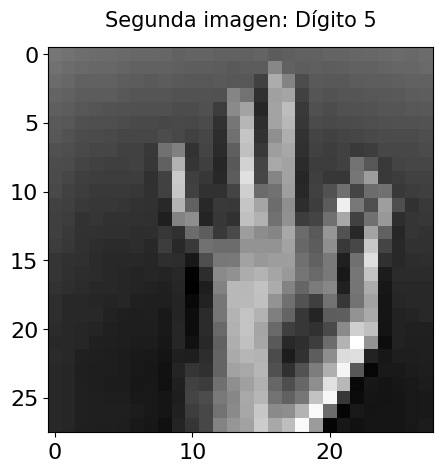

In [ ]:
pixel_columns = [col for col in lenguaje.columns if col.startswith('pixel')]
second_image_pixels = lenguaje.loc[1, pixel_columns].values.reshape([28, 28])

plt.figure(figsize = (5, 5))
plt.imshow(second_image_pixels, cmap='gray_r')
plt.title('Segunda imagen: Dígito {}'.format(lenguaje.loc[1, 'label']), fontsize = 15, pad = 15)
plt.savefig("Second image.png")
plt.show()

**Histograma de un pixel**

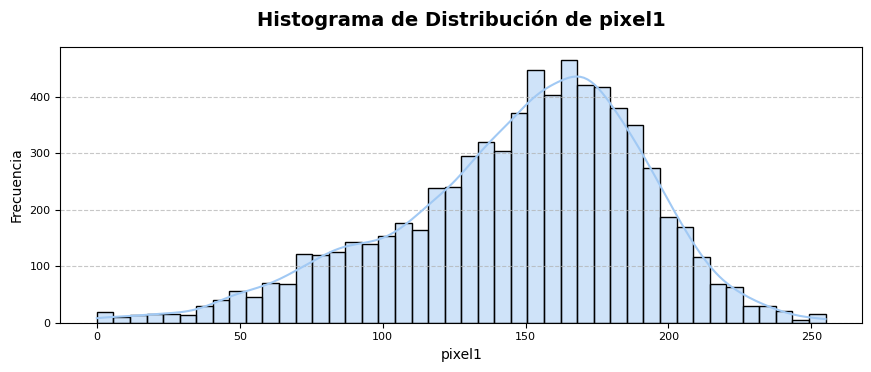

In [ ]:
col_to_plot = 'pixel1'
plt.figure(figsize=(9, 4))
paleta_pastel = sns.color_palette("pastel")
color_actual = paleta_pastel[0]

sns.histplot(
    data=lenguaje,
    x=col_to_plot,
    kde=True,
    color=color_actual,
    edgecolor='black'
)

plt.title(
    f'Histograma de Distribución de {col_to_plot}',
    fontsize=14,
    fontweight='bold',
    pad=15
)
plt.xlabel(col_to_plot, fontsize=10)
plt.ylabel('Frecuencia', fontsize=10)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

# Hallazgos

* **No hay valores ausentes.**
* **Las variables en conjunto conforman una imagen, por ende, son poco distintas.**
* **Todas las variables son del tipo enteras.**

# Análisis de Componentes Principales (PCA)

El **Análisis de Componentes Principales** (PCA) (*Principal Component Analysis*) es un método estadístico que permite simplificar la complejidad de espacios muestrales con muchas dimensiones a la vez que conserva su información.

En otras palabras, PCA busca un nuevo sistema de coordenadas para un conjunto de datos, de modo que la mayor variabilidad de los datos se encuentre a lo largo de los primeros ejes de coordenadas, llamados Componentes Principales ($\text{CP}$).

PCA define el $k$-ésimo Componente Principal ($\text{CP}_k$) como el vector unitario sobre el cual la proyección de los datos originales tiene la máxima varianza posible, siendo ortogonal a todos los componentes principales anteriores ($\text{CP}_1, \dots, \text{CP}_{k-1}$).

Donde, cada componente principal $\text{CP}_i$ se obtiene por combinación lineal de las variables originales. Es posible interpretarlos como nuevas variables obtenidas al combinar de una determinada forma las variables originales. Sea entonces:

$$\text{CP}_i = w_{i1}x_1 + w_{i2}x_2 + \dots + w_{iD}x_D$$

Donde:
* $w_{ij}$ son los pesos o cargas (loadings) que definen la dirección del componente.
* $x_{j}$ son las variables de entrada.

Los Componentes Principales se obtienen calculando los vectores propios de la matriz de covarianza o correlación de los datos de entrada.
* Los valores propios $\lambda_i$ asociados a cada vector propio indican la cantidad de varianza explicada por su respectivo componente principal ($\text{CP}_i$).
* El primer componente ($\text{CP}_1$) corresponde al vector propio con el mayor valor propio.

Una vez calculada la primera componente $\text{CP}_1$ se calcula la segunda $\text{CP}_2$ repitiendo el mismo proceso, pero atendiendo a la condición de que la combinación lineal no puede estar correlacionada con la primera componente. Los $\text{CP}_i$ son independientes entre sí, lo que refleja ortogonalidad en su forma *n*-dimensional.

Cabe mencionar que PCA es una técnica empleada para eliminar la multicolinealidad, sin embargo, la interpretabilidad de los componentes resultantes no tiene otra explicación más que la de ser una combinación lineal de las variables originales.


## **Escalamiento**

El escalamiento es el proceso de transformar los valores numéricos de las características de un conjunto de datos para que caigan dentro de un rango específico o tengan una distribución estandarizada.

Existen dos tipos principales de escalamiento:

* Normalización (*Min-Max Scaling*): Ajusta los datos para que caigan dentro de un rango fijo, generalmente [0, 1].
* Estandarización (*Z-Score Normalization*): Transforma los datos para que tengan una media de 0 y una desviación estándar de 1.

**Librerías**

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
scaler = StandardScaler()

In [ ]:
lenguaje_df.head(3)

,pixel1,pixel10,pixel100,pixel101,pixel102,pixel103,pixel104,pixel105,pixel106,pixel107,pixel108,pixel109,pixel11,pixel110,pixel111,pixel112,pixel113,pixel114,pixel115,pixel116,pixel117,pixel118,pixel119,pixel12,pixel120,pixel121,pixel122,pixel123,pixel124,pixel125,pixel126,pixel127,pixel128,pixel129,pixel13,pixel130,pixel131,pixel132,pixel133,pixel134,pixel135,pixel136,pixel137,pixel138,pixel139,pixel14,pixel140,pixel141,pixel142,pixel143,pixel144,pixel145,pixel146,pixel147,pixel148,pixel149,pixel15,pixel150,pixel151,pixel152,pixel153,pixel154,pixel155,pixel156,pixel157,pixel158,pixel159,pixel16,pixel160,pixel161,pixel162,pixel163,pixel164,pixel165,pixel166,pixel167,pixel168,pixel169,pixel17,pixel170,pixel171,pixel172,pixel173,pixel174,pixel175,pixel176,pixel177,pixel178,pixel179,pixel18,pixel180,pixel181,pixel182,pixel183,pixel184,pixel185,pixel186,pixel187,pixel188,pixel189,pixel19,pixel190,pixel191,pixel192,pixel193,pixel194,pixel195,pixel196,pixel197,pixel198,pixel199,pixel2,pixel20,pixel200,pixel201,pixel202,pixel203,pixel204,pixel205,pixel206,pixel207,pixel208,pixel209,pixel21,pixel210,pixel211,pixel212,pixel213,pixel214,pixel215,pixel216,pixel217,pixel218,pixel219,pixel22,pixel220,pixel221,pixel222,pixel223,pixel224,pixel225,pixel226,pixel227,pixel228,pixel229,pixel23,pixel230,pixel231,pixel232,pixel233,pixel234,pixel235,pixel236,pixel237,pixel238,pixel239,pixel24,pixel240,pixel241,pixel242,pixel243,pixel244,pixel245,pixel246,pixel247,pixel248,pixel249,pixel25,pixel250,pixel251,pixel252,pixel253,pixel254,pixel255,pixel256,pixel257,pixel258,pixel259,pixel26,pixel260,pixel261,pixel262,pixel263,pixel264,pixel265,pixel266,pixel267,pixel268,pixel269,pixel27,pixel270,pixel271,pixel272,pixel273,pixel274,pixel275,pixel276,pixel277,pixel278,pixel279,pixel28,pixel280,pixel281,pixel282,pixel283,pixel284,pixel285,pixel286,pixel287,pixel288,pixel289,pixel29,pixel290,pixel291,pixel292,pixel293,pixel294,pixel295,pixel296,pixel297,pixel298,pixel299,pixel3,pixel30,pixel300,pixel301,pixel302,pixel303,pixel304,pixel305,pixel306,pixel307,pixel308,pixel309,pixel31,pixel310,pixel311,pixel312,pixel313,pixel314,pixel315,pixel316,pixel317,pixel318,pixel319,pixel32,pixel320,pixel321,pixel322,pixel323,pixel324,pixel325,pixel326,pixel327,pixel328,pixel329,pixel33,pixel330,pixel331,pixel332,pixel333,pixel334,pixel335,pixel336,pixel337,pixel338,pixel339,pixel34,pixel340,pixel341,pixel342,pixel343,pixel344,pixel345,pixel346,pixel347,pixel348,pixel349,pixel35,pixel350,pixel351,pixel352,pixel353,pixel354,pixel355,pixel356,pixel357,pixel358,pixel359,pixel36,pixel360,pixel361,pixel362,pixel363,pixel364,pixel365,pixel366,pixel367,pixel368,pixel369,pixel37,pixel370,pixel371,pixel372,pixel373,pixel374,pixel375,pixel376,pixel377,pixel378,pixel379,pixel38,pixel380,pixel381,pixel382,pixel383,pixel384,pixel385,pixel386,pixel387,pixel388,pixel389,pixel39,pixel390,pixel391,pixel392,pixel393,pixel394,pixel395,pixel396,pixel397,pixel398,pixel399,pixel4,pixel40,pixel400,pixel401,pixel402,pixel403,pixel404,pixel405,pixel406,pixel407,pixel408,pixel409,pixel41,pixel410,pixel411,pixel412,pixel413,pixel414,pixel415,pixel416,pixel417,pixel418,pixel419,pixel42,pixel420,pixel421,pixel422,pixel423,pixel424,pixel425,pixel426,pixel427,pixel428,pixel429,pixel43,pixel430,pixel431,pixel432,pixel433,pixel434,pixel435,pixel436,pixel437,pixel438,pixel439,pixel44,pixel440,pixel441,pixel442,pixel443,pixel444,pixel445,pixel446,pixel447,pixel448,pixel449,pixel45,pixel450,pixel451,pixel452,pixel453,pixel454,pixel455,pixel456,pixel457,pixel458,pixel459,pixel46,pixel460,pixel461,pixel462,pixel463,pixel464,pixel465,pixel466,pixel467,pixel468,pixel469,pixel47,pixel470,pixel471,pixel472,pixel473,pixel474,pixel475,pixel476,pixel477,pixel478,pixel479,pixel48,pixel480,pixel481,pixel482,pixel483,pixel484,pixel485,pixel486,pixel487,pixel488,pixel489,pixel49,pixel490,pixel491,pixel492,pixel493,pixel494,pixel495,pixel496,pixel497,pixel498,pixel499,pixel5,pixel50,pixel500,pixel501,pixel502,pixel503,

In [ ]:
df = lenguaje_df.copy()

**Normalización *Z-score***

In [ ]:
columns = df.columns
df = scaler.fit_transform(df)
df = pd.DataFrame(data = df, columns = columns)

In [ ]:
df.head(3)

,pixel1,pixel10,pixel100,pixel101,pixel102,pixel103,pixel104,pixel105,pixel106,pixel107,pixel108,pixel109,pixel11,pixel110,pixel111,pixel112,pixel113,pixel114,pixel115,pixel116,pixel117,pixel118,pixel119,pixel12,pixel120,pixel121,pixel122,pixel123,pixel124,pixel125,pixel126,pixel127,pixel128,pixel129,pixel13,pixel130,pixel131,pixel132,pixel133,pixel134,pixel135,pixel136,pixel137,pixel138,pixel139,pixel14,pixel140,pixel141,pixel142,pixel143,pixel144,pixel145,pixel146,pixel147,pixel148,pixel149,pixel15,pixel150,pixel151,pixel152,pixel153,pixel154,pixel155,pixel156,pixel157,pixel158,pixel159,pixel16,pixel160,pixel161,pixel162,pixel163,pixel164,pixel165,pixel166,pixel167,pixel168,pixel169,pixel17,pixel170,pixel171,pixel172,pixel173,pixel174,pixel175,pixel176,pixel177,pixel178,pixel179,pixel18,pixel180,pixel181,pixel182,pixel183,pixel184,pixel185,pixel186,pixel187,pixel188,pixel189,pixel19,pixel190,pixel191,pixel192,pixel193,pixel194,pixel195,pixel196,pixel197,pixel198,pixel199,pixel2,pixel20,pixel200,pixel201,pixel202,pixel203,pixel204,pixel205,pixel206,pixel207,pixel208,pixel209,pixel21,pixel210,pixel211,pixel212,pixel213,pixel214,pixel215,pixel216,pixel217,pixel218,pixel219,pixel22,pixel220,pixel221,pixel222,pixel223,pixel224,pixel225,pixel226,pixel227,pixel228,pixel229,pixel23,pixel230,pixel231,pixel232,pixel233,pixel234,pixel235,pixel236,pixel237,pixel238,pixel239,pixel24,pixel240,pixel241,pixel242,pixel243,pixel244,pixel245,pixel246,pixel247,pixel248,pixel249,pixel25,pixel250,pixel251,pixel252,pixel253,pixel254,pixel255,pixel256,pixel257,pixel258,pixel259,pixel26,pixel260,pixel261,pixel262,pixel263,pixel264,pixel265,pixel266,pixel267,pixel268,pixel269,pixel27,pixel270,pixel271,pixel272,pixel273,pixel274,pixel275,pixel276,pixel277,pixel278,pixel279,pixel28,pixel280,pixel281,pixel282,pixel283,pixel284,pixel285,pixel286,pixel287,pixel288,pixel289,pixel29,pixel290,pixel291,pixel292,pixel293,pixel294,pixel295,pixel296,pixel297,pixel298,pixel299,pixel3,pixel30,pixel300,pixel301,pixel302,pixel303,pixel304,pixel305,pixel306,pixel307,pixel308,pixel309,pixel31,pixel310,pixel311,pixel312,pixel313,pixel314,pixel315,pixel316,pixel317,pixel318,pixel319,pixel32,pixel320,pixel321,pixel322,pixel323,pixel324,pixel325,pixel326,pixel327,pixel328,pixel329,pixel33,pixel330,pixel331,pixel332,pixel333,pixel334,pixel335,pixel336,pixel337,pixel338,pixel339,pixel34,pixel340,pixel341,pixel342,pixel343,pixel344,pixel345,pixel346,pixel347,pixel348,pixel349,pixel35,pixel350,pixel351,pixel352,pixel353,pixel354,pixel355,pixel356,pixel357,pixel358,pixel359,pixel36,pixel360,pixel361,pixel362,pixel363,pixel364,pixel365,pixel366,pixel367,pixel368,pixel369,pixel37,pixel370,pixel371,pixel372,pixel373,pixel374,pixel375,pixel376,pixel377,pixel378,pixel379,pixel38,pixel380,pixel381,pixel382,pixel383,pixel384,pixel385,pixel386,pixel387,pixel388,pixel389,pixel39,pixel390,pixel391,pixel392,pixel393,pixel394,pixel395,pixel396,pixel397,pixel398,pixel399,pixel4,pixel40,pixel400,pixel401,pixel402,pixel403,pixel404,pixel405,pixel406,pixel407,pixel408,pixel409,pixel41,pixel410,pixel411,pixel412,pixel413,pixel414,pixel415,pixel416,pixel417,pixel418,pixel419,pixel42,pixel420,pixel421,pixel422,pixel423,pixel424,pixel425,pixel426,pixel427,pixel428,pixel429,pixel43,pixel430,pixel431,pixel432,pixel433,pixel434,pixel435,pixel436,pixel437,pixel438,pixel439,pixel44,pixel440,pixel441,pixel442,pixel443,pixel444,pixel445,pixel446,pixel447,pixel448,pixel449,pixel45,pixel450,pixel451,pixel452,pixel453,pixel454,pixel455,pixel456,pixel457,pixel458,pixel459,pixel46,pixel460,pixel461,pixel462,pixel463,pixel464,pixel465,pixel466,pixel467,pixel468,pixel469,pixel47,pixel470,pixel471,pixel472,pixel473,pixel474,pixel475,pixel476,pixel477,pixel478,pixel479,pixel48,pixel480,pixel481,pixel482,pixel483,pixel484,pixel485,pixel486,pixel487,pixel488,pixel489,pixel49,pixel490,pixel491,pixel492,pixel493,pixel494,pixel495,pixel496,pixel497,pixel498,pixel499,pixel5,pixel50,pixel500,pixel501,pixel502,pixel503,

In [ ]:
info_var(df)

Streaming output truncated to the last 5000 lines.
 -2.19649296 -2.10461426 -2.2148687  -1.82897813 -2.39862612 -2.25162019
 -1.97598406 -2.76614095 -2.47212908 -2.54563205 -2.36187464 -2.6558865
 -2.60075927 -2.72938947 -1.99435981 -2.28837167 -2.63751076 -2.58238353
 -2.49050483 -2.38025038 -1.86572962 -2.56400779 -2.69263798 -2.08623851
 -2.71101372]


--- Información para la columna: pixel734 ---

Descripción:
count    7.172000e+03
mean    -2.100322e-16
std      1.000070e+00
min     -2.879692e+00
25%     -7.652247e-01
50%      6.943328e-02
75%      7.974405e-01
max      1.850037e+00
Name: pixel734, dtype: float64

Valores únicos:
[-1.47004695  0.42184442 -0.00475854  1.20085851 -0.11604627 -0.19023808
 -0.2644299   1.5347217   0.01378942 -0.33862172  1.85003692  1.27505033
 -0.78377263  0.36620055 -1.84100605  1.1637626  -1.06199195  1.31214624
 -1.00634809  0.23636487  0.19926896  0.21781692  0.94118715 -0.07895036
 -1.32166332 -0.98780013 -0.17169013 -2.08212946 -1.19182763  0.75

# Determinación del número de Componentes Principales

Para determinar el **número de componentes principales** se aplica PCA con el número original de dimensiones, esto es con 31 variables, para crear el gráfico de sedimentación y visualizar cómo los datos explican o capturan a la varianza.

Las cargas pueden interpretarse como la importancia que tiene cada variable en cada componente y, por lo tanto, ayudan a conocer que tipo de información que recoge cada una de las componentes.

Dado un set de datos $X$ con $n$ observaciones y $t$ variables, el proceso a seguir para calcular la primera componente principal es:
* Centralización de las variables: se resta a cada valor la media de la variable a la que pertenece. Con esto se consigue que todas las variables tengan media cero.
* Se resuelve un problema de optimización para encontrar el valor de los loadings con los que se maximiza la varianza. Una forma de resolver esta optimización es mediante el cálculo de eigenvector-eigenvalue de la matriz de covarianzas.

Una vez calculada la primera componente (Z1) se calcula la segunda (Z2) repitiendo el mismo proceso, pero añadiendo la condición de que la combinación lineal no puede estar correlacionada con la primera componente. Esto equivale a decir que Z1 y Z2 tienen que ser perpendiculares.
El orden de importancia de las componentes viene dado por la magnitud del eigenvalue asociado a cada eigenvector.


In [ ]:
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

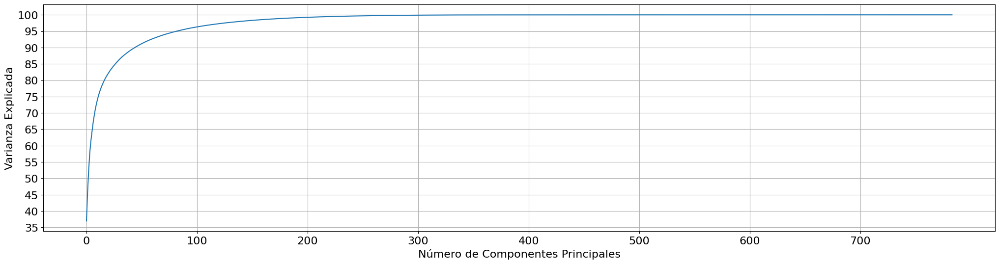

In [ ]:
plt.figure(figsize=(25, 6))
pca_31 = PCA(n_components = 784)
pca_31.fit(df)
varianza_acumulada_porcentaje = np.cumsum(pca_31.explained_variance_ratio_ * 100)

plt.plot(varianza_acumulada_porcentaje)
plt.xlabel('Número de Componentes Principales')
plt.ylabel('Varianza Explicada')

plt.xticks(ticks=np.arange(0, 800, 100))
plt.yticks(ticks=np.arange(35, 101, 5))
plt.grid(True)

plt.show()

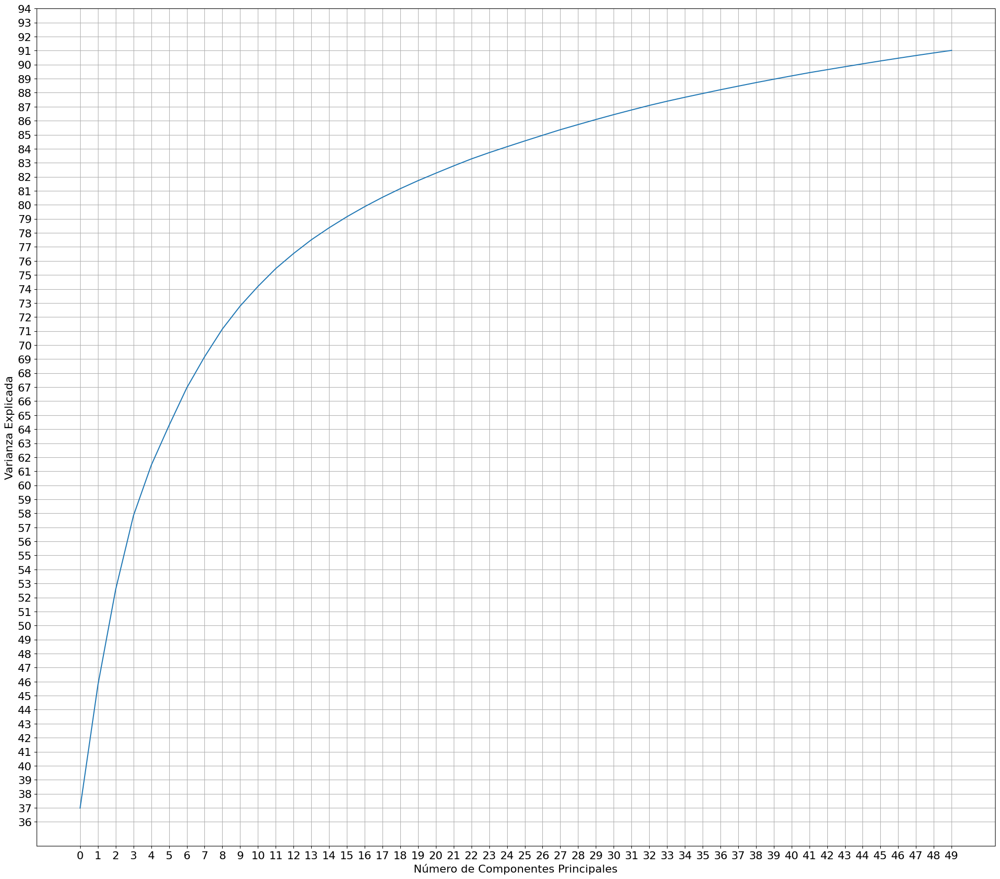

In [ ]:
plt.figure(figsize=(25, 22))
pca_31 = PCA(n_components = 50)
pca_31.fit(df)
varianza_acumulada_porcentaje = np.cumsum(pca_31.explained_variance_ratio_ * 100)

plt.plot(varianza_acumulada_porcentaje)
plt.xlabel('Número de Componentes Principales')
plt.ylabel('Varianza Explicada')

plt.xticks(ticks=np.arange(0, 50, 1))
plt.yticks(ticks=np.arange(36, 95, 1))
plt.grid(True)

plt.show()

## **Varianza explicada con 18 Componentes Principales (80.54 %)**

In [ ]:
import plotly.express as px

In [ ]:
pca_18 = PCA(n_components = 18)
lenguaje_pca_18_reduced = pca_18.fit_transform(df)
lenguaje_pca_18_recovered = pca_18.inverse_transform(lenguaje_pca_18_reduced)

In [ ]:
varianza_explicada_18CP = np.cumsum(pca_18.explained_variance_ratio_ * 100)[-1]

In [ ]:
print(f"Varianza Explicada con 18 Componentes Principales: {varianza_explicada_18CP:.2f} %")

Varianza Explicada con 18 Componentes Principales: 80.54 %


In [ ]:
pd.DataFrame(lenguaje_pca_18_reduced)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,-17.798480,2.728662,-2.885299,-8.972169,-4.604611,-2.455601,3.526075,2.193565,-1.381465,-0.467587,-2.284532,3.980978,-0.993722,0.175170,-1.869894,2.447065,-1.070046,0.441969
1,-9.858433,3.974073,1.758543,7.663047,-3.273518,-1.208112,1.330367,-1.654899,-0.763304,-1.594809,3.064426,2.094169,3.988439,-3.697697,-1.653931,-1.121838,1.072632,1.813047
2,-4.581354,-14.624835,13.485646,-3.355981,1.786856,0.376288,-3.760902,-1.161817,-5.032109,1.251054,-3.731152,-5.267217,-1.057729,-1.862138,-0.178845,1.426683,-0.337842,0.796172
3,15.370083,2.977758,-5.862206,-0.938779,11.322029,-10.063212,3.123268,4.969764,2.815650,-2.774396,-0.869572,-2.345632,0.870215,-3.015759,1.256128,2.087197,4.546160,5.533376
4,18.250450,-5.595476,-14.433197,2.526656,-3.967347,2.745052,-3.287845,4.506219,-4.822266,3.755564,2.960962,5.215606,-1.648359,1.916991,-1.858053,-0.223267,0.302092,-0.527462
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7167,-9.063048,-14.838821,8.561195,-4.370744,-0.632427,3.558950,-1.269674,-0.095735,1.621257,1.183769,5.884201,0.296787,0.540878,-0.516981,0.709118,2.713461,-5.050926,-1.466014
7168,7.497493,0.812629,2.406972,7.308559,6.558233,-2.787509,1.683050,0.607611,-1.018982,-0.858015,-1.020957,-2.831669,-2.754728,2.165602,-2.121717,0.680473,0.008077,0.474285
7169,3.543813,17.682446,6.436514,-7.971777,5.223461,10.209165,1.803530,-3.809716,3.602852,-5.469629,-3.205702,6.640003,0.713464,-3.102142,-1.716913,3.695871,1.599332,-5.227203
7170,39.293882,0.411308,2.446190,3.332731,10.518793,4.266884,8.553815,0.095950,3.374371,-7.341880,0.481727,4.770583,2.188911,-1.588339,-0.378326,1.248791,-1.274890,-0.730770


In [ ]:
pd.DataFrame(lenguaje_pca_18_recovered)

0         1         2         3         4         5         6    \
0    -0.262094 -0.549743 -0.651778 -0.529211 -0.699618 -0.788489 -0.736706   
1    -0.406663 -0.827915 -0.889480 -0.897358 -0.715156 -0.600787 -0.668488   
2    -1.494881 -0.493024  0.243480  0.099545  0.162839  0.176807  0.240036   
3     1.400156  1.391696  1.075089  0.385653  0.317174  0.361981  0.171650   
4     0.856034  1.027082  0.956815  1.222531  0.636122  0.479155  0.869632   
...        ...       ...       ...       ...       ...       ...       ...   
7167 -0.999119 -1.278640 -0.446797  0.049957  0.055513  0.111090  0.294349   
7168  0.017781  0.368160  0.558103  0.406281  0.069668 -0.130059 -0.129219   
7169  1.043864  0.521276 -1.144955 -1.101324 -0.949830 -0.543189 -0.392997   
7170  1.642429  1.967362  0.945651  0.832005  0.726446  0.915804  1.021176   
7171  0.693741  0.008524 -1.710819 -1.661659 -1.518693 -1.136080 -0.973980   

           7         8         9         10        11        12        13   \
0    -0.699042 -0.837043 -0.876359 -0.816474 -0.838426 -0.569945 -0.767176   
1    -0.773505 -0.934161 -1.018215 -1.109644 -1.082548 -0.867266 -0.991395   
2     0.409490  0.380987  0.443228  0.390565  0.487322 -0.431973  0.548194   
3     0.118231  0.195205  0.242606  0.354862  0.642448  1.381096  1.219875   
4     0.869743  0.919424  0.841495  0.712106  0.511753  1.014668  0.439356   
...        ...       ...       ...       ...       ...       ...       ...   
7167  0.429933  0.534861  0.554056  0.584651  0.720254 -1.215858  0.706217   
7168 -0.209453 -0.065586  0.020195  0.050072  0.224513  0.382443  0.449468   
7169 -0.047400  0.388137  0.777253  0.961891  0.733928  0.524264  0.476863   
7170  1.237002  1.675076  1.987789  2.251801  2.355057  2.019516  2.364326   
7171 -0.623496 -0.198727  0.204919  0.417693  0.189232 -0.001021 -0.033881   

           14        15        16        17        18        19        20   \
0    -0.638359 -0.580802 -0.243220 -0.252330 -0.307439 -0.361498 -0.309875   
1    -0.968368 -0.968391 -0.323577 -0.332274 -0.384287 -0.425144 -0.488493   
2     0.520976  0.555212 -1.536266 -1.491875 -1.440545 -1.317182 -1.240455   
3     1.403646  1.512507  1.291811  1.320065  1.361314  1.392849  1.396447   
4     0.363103  0.295698  0.957327  0.990787  1.005968  1.047275  1.123484   
...        ...       ...       ...       ...       ...       ...       ...   
7167  0.671026  0.649786 -0.985911 -1.050665 -1.163032 -1.369806 -1.227055   
7168  0.519067  0.542442  0.007759  0.043307  0.084959  0.158433  0.185726   
7169  0.301386  0.323108  1.037046  0.989456  0.936272  0.806984  0.828739   
7170  2.251808  2.200148  1.634176  1.674042  1.719301  1.751206  1.843505   
7171 -0.179000 -0.136083  0.688140  0.623830  0.549050  0.402317  0.414849   

           21        22        23        24        25        26        27   \
0    -0.399002 -0.421539 -0.590726 -0.430681 -0.504964 -0.596308 -0.575600   
1    -0.552360 -0.543166 -0.946374 -0.602618 -0.823759 -0.865312 -0.934751   
2    -1.111889 -0.773461 -0.308947 -0.658414 -0.484939 -0.264590 -0.243185   
3     1.424805  1.389279  1.353573  1.382624  1.260521  1.056783  1.009646   
4     1.129249  1.036380  0.972073  1.009859  1.022656  1.099786  1.173254   
...        ...       ...       ...       ...       ...       ...       ...   
7167 -1.312690 -1.503692 -1.063118 -1.516633 -1.239084 -1.117718 -0.945628   
7168  0.206575  0.269300  0.415121  0.327932  0.387475  0.425311  0.462184   
7169  0.813386  0.685565  0.407802  0.697861  0.402341  0.089465 -0.584504   
7170  1.888685  1.834176  2.086904  1.901558  1.849110  1.684774  1.442685   
7171  0.379776  0.255492 -0.147557  0.269600 -0.098031 -0.439677 -1.123999   

           28        29        30        31        32        33        34   \
0    -0.529884 -0.587750 -0.666904 -0.769500 -0.720196 -0.508627 -0.628046   
1    -0.906860 -0.774084 -1.004141 -0.949303 -0.867067 -0.816170 -1.027368   
2    -0.194137  0.106165  0.6

In [ ]:
component_names = [f'CP{i}' for i in range(1, 19)]
df_pca18 = pd.DataFrame(data = lenguaje_pca_18_reduced,
                      columns = component_names)
df_pca18['numero'] = senias['label']

In [ ]:
pastel_colors = px.colors.qualitative.Pastel

fig = px.scatter_matrix(
    df_pca18,
    dimensions=component_names,
    color='numero',
    color_discrete_sequence=pastel_colors,
    title=f'Matriz de Gráficos de Dispersión de 18 CP | Varianza Acumulada: {varianza_explicada_18CP:.2f}%',
    template='plotly_white'
)

fig.update_traces(
    diagonal_visible=False,
    marker=dict(size=3, opacity=0.8),
    showlowerhalf=True
)

fig.update_layout(
    height=800,
    title_font_size=16,
    hoverlabel=dict(bgcolor="white", font_size=10),
    legend_title_text='Diagnóstico',
    font=dict(family="Arial", size=10)
)

fig.show()

**184 componentes**

In [ ]:
pca_184 = PCA(n_components = 184)
lenguaje_pca_184_reduced = pca_184.fit_transform(df)
lenguaje_pca_184_recovered = pca_184.inverse_transform(lenguaje_pca_184_reduced)

Text(0.5, 1.0, '184 Componentes')

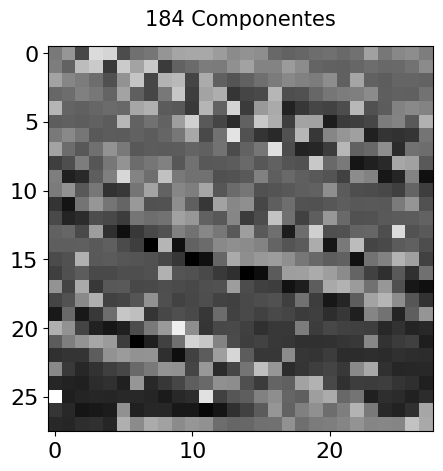

In [ ]:
imagen_pca_184 = lenguaje_pca_184_recovered[1,:].reshape([28,28])
plt.figure(figsize = (5, 5))
plt.imshow(imagen_pca_184, cmap='gray_r')
plt.title('184 Componentes', fontsize=15, pad=15)

**18 componentes**

Text(0.5, 1.0, '18 Componentes')

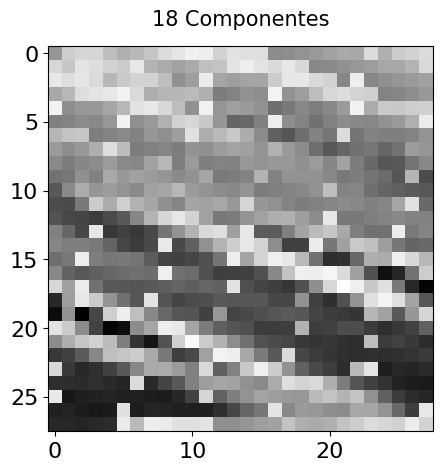

In [ ]:
imagen_pca_18 = lenguaje_pca_18_recovered[1,:].reshape([28,28])
plt.figure(figsize = (5, 5))
plt.imshow(imagen_pca_18, cmap='gray_r')
plt.title('18 Componentes', fontsize=15, pad=15)

**18 componentes principales es lo mínimo para conservar una buena varianza explicada.**

## **Varianza explicada con 3 Componentes Principales (52.57 %)**

In [ ]:
pca_3 = PCA(n_components = 3)
lenguaje_pca_3_reduced = pca_3.fit_transform(df)
lenguaje_pca_3_recovered = pca_3.inverse_transform(lenguaje_pca_3_reduced)

In [ ]:
varianza_explicada_3CP = np.cumsum(pca_3.explained_variance_ratio_ * 100)[-1]

In [ ]:
print(f"Varianza Explicada con 3 Componentes Principales: {varianza_explicada_3CP:.2f} %")

Varianza Explicada con 3 Componentes Principales: 52.57 %


In [ ]:
pd.DataFrame(lenguaje_pca_3_reduced)

,0,1,2
0,-17.798480,2.728662,-2.885298
1,-9.858433,3.974074,1.758539
2,-4.581354,-14.624834,13.485645
3,15.370083,2.977758,-5.862207
4,18.250450,-5.595477,-14.433193
...,...,...,...
7167,-9.063048,-14.838821,8.561197
7168,7.497493,0.812629,2.406972
7169,3.543813,17.682446,6.436516
7170,39.293882,0.411308,2.446190


In [ ]:
pd.DataFrame(lenguaje_pca_3_recovered)

0         1         2         3         4         5         6    \
0    -0.575679 -0.828896 -0.677905 -0.664261 -0.619506 -0.652894 -0.701263   
1    -0.302209 -0.511582 -0.554409 -0.559098 -0.514838 -0.513983 -0.547543   
2    -1.418265 -0.819488 -0.157679 -0.035166 -0.034308  0.032123  0.166288   
3     1.052141  1.017095  0.685807  0.628466  0.582822  0.566611  0.547234   
4     1.022368  1.270144  1.322422  1.305801  1.195063  1.131751  1.148637   
...        ...       ...       ...       ...       ...       ...       ...   
7167 -1.470681 -0.930144 -0.170168 -0.043356 -0.047698 -0.013281  0.102346   
7168  0.305018  0.346745  0.189318  0.172008  0.164001  0.185229  0.195800   
7169  0.868264  0.280809 -0.596456 -0.712925 -0.637471 -0.593255 -0.690187   
7170  1.736104  2.030007  1.425527  1.347939  1.260062  1.313682  1.365008   
7171  0.534744 -0.261058 -1.108309 -1.223950 -1.111312 -1.082529 -1.217095   

           7         8         9         10        11        12        13   \
0    -0.743699 -0.818643 -0.854467 -0.819254 -0.770049 -0.841425 -0.706964   
1    -0.567032 -0.578242 -0.572920 -0.554258 -0.538248 -0.528146 -0.516873   
2     0.195583  0.143244  0.276412  0.255215  0.355415 -0.768829  0.453631   
3     0.563566  0.624719  0.577135  0.560697  0.486042  1.009744  0.403272   
4     1.162375  1.144666  1.037203  1.015781  0.971312  1.296247  0.922988   
...        ...       ...       ...       ...       ...       ...       ...   
7167  0.113971  0.018522  0.108177  0.099158  0.214378 -0.878611  0.333651   
7168  0.214122  0.263266  0.285781  0.271776  0.241349  0.344610  0.204070   
7169 -0.687260 -0.532148 -0.500373 -0.494432 -0.596931  0.215331 -0.708568   
7170  1.445615  1.634026  1.670786  1.603679  1.459320  2.034693  1.285483   
7171 -1.240903 -1.120878 -1.105371 -1.076297 -1.153817 -0.339921 -1.232335   

           14        15        16        17        18        19        20   \
0    -0.644304 -0.615949 -0.581091 -0.607300 -0.638081 -0.672016 -0.685947   
1    -0.482762 -0.470449 -0.300339 -0.319489 -0.342682 -0.371623 -0.397492   
2     0.480420  0.464361 -1.432716 -1.417526 -1.395779 -1.335557 -1.280281   
3     0.344779  0.332729  1.059689  1.075356  1.092442  1.097185  1.093973   
4     0.856725  0.848699  1.015723  1.050530  1.092383  1.136454  1.192284   
...        ...       ...       ...       ...       ...       ...       ...   
7167  0.375847  0.371930 -1.489734 -1.478864 -1.461896 -1.406999 -1.344013   
7168  0.176907  0.164137  0.310447  0.318088  0.326521  0.332488  0.326179   
7169 -0.729209 -0.735928  0.896050  0.870707  0.835999  0.764532  0.662209   
7170  1.143080  1.087690  1.754540  1.802789  1.857787  1.904093  1.906976   
7171 -1.213028 -1.202261  0.561364  0.516649  0.458803  0.359544  0.239293   

           21        22        23        24        25        26        27   \
0    -0.721886 -0.741071 -0.859400 -0.745136 -0.793805 -0.808572 -0.734039   
1    -0.429926 -0.440617 -0.551194 -0.451482 -0.485653 -0.510107 -0.510466   
2    -1.179585 -1.014601 -0.665505 -0.948117 -0.832246 -0.708238 -0.587259   
3     1.083647  1.024656  0.985133  1.003317  0.992571  0.958275  0.873731   
4     1.231001  1.185202  1.319316  1.193772  1.219587  1.242963  1.274691   
...        ...       ...       ...       ...       ...       ...       ...   
7167 -1.250487 -1.104645 -0.777260 -1.037211 -0.938016 -0.814014 -0.645723   
7168  0.329987  0.330860  0.340633  0.325122  0.336350  0.328485  0.270555   
7169  0.559370  0.471097  0.107713  0.400636  0.311811  0.179975 -0.057998   
7170  1.942022  1.922928  2.030595  1.904362  1.962773  1.943260  1.726783   
7171  0.105377  0.000502 -0.467201 -0.077799 -0.204186 -0.355415 -0.564936   

           28        29        30        31        32        33        34   \
0    -0.731479 -0.718584 -0.701696 -0.657093 -0.632245 -0.625544 -0.870470   
1    -0.537933 -0.536821 -0.547754 -0.550808 -0.554717 -0.567423 -0.567825   
2    -0.503873 -0.349105  0.0

In [ ]:
df_pca3 = pd.DataFrame(data = lenguaje_pca_3_reduced,
                      columns = ['PC1', 'PC2', 'PC3'])
df_pca3['numero'] = senias['label']

In [ ]:
pastel_colors = px.colors.qualitative.Pastel

fig = px.scatter_3d(df_pca3,
                    x='PC1',
                    y='PC2',
                    z='PC3',
                    color='numero',
                    color_discrete_sequence=pastel_colors,
                    title=f'PCA 3D: Reducción de 784 a 3 Componentes Principales | Varianza Explicada Acumulada: {varianza_explicada_3CP:.2f}%',
                    labels={'PC1': 'Componente Principal 1',
                            'PC2': 'Componente Principal 2',
                            'PC3': 'Componente Principal 3'},
                    template='plotly_white'
                   )

fig.update_traces(marker=dict(size=4,
                              line=dict(width=1, color='DarkSlateGrey')),
                  selector=dict(mode='markers'))

fig.update_layout(
    margin=dict(l=0, r=0, b=0, t=50),
    scene=dict(
        xaxis=dict(backgroundcolor="lightgrey", gridcolor="white"),
        yaxis=dict(backgroundcolor="lightgrey", gridcolor="white"),
        zaxis=dict(backgroundcolor="lightgrey", gridcolor="white"),

        camera=dict(
            up=dict(x=0, y=0, z=1),
            center=dict(x=0, y=0, z=0),
            eye=dict(x=1.25, y=1.25, z=1.25)
        )
    ),
    legend_title_text='Número',
    hoverlabel=dict(bgcolor="white", font_size=12)
)
fig.show()

**La caída de varianza explicada por 3 componentes principales rebasa el 20 % permitido. Por lo tanto, no se considera.**

## **Varianza explicada con 2 Componentes Principales (45.74 %)**

In [ ]:
pca_2 = PCA(n_components = 2)
lenguaje_pca_2_reduced = pca_2.fit_transform(df)
lenguaje_pca_2_recovered = pca_2.inverse_transform(lenguaje_pca_2_reduced)

In [ ]:
varianza_explicada_2CP = np.cumsum(pca_2.explained_variance_ratio_ * 100)[-1]

In [ ]:
print(f"Varianza Explicada con 2 Componentes Principales: {varianza_explicada_2CP:.2f} %")

Varianza Explicada con 2 Componentes Principales: 45.74 %


In [ ]:
pd.DataFrame(lenguaje_pca_2_reduced)

,0,1
0,-17.798480,2.728662
1,-9.858433,3.974072
2,-4.581354,-14.624834
3,15.370083,2.977759
4,18.250450,-5.595476
...,...,...
7167,-9.063048,-14.838820
7168,7.497493,0.812629
7169,3.543813,17.682446
7170,39.293882,0.411308


In [ ]:
pd.DataFrame(lenguaje_pca_2_recovered)

0         1         2         3         4         5         6    \
0    -0.671509 -0.905519 -0.768010 -0.750852 -0.697018 -0.714348 -0.754133   
1    -0.243802 -0.464882 -0.499491 -0.506322 -0.467597 -0.476528 -0.515320   
2    -0.970366 -0.461357  0.263468  0.369552  0.327974  0.319355  0.413397   
3     0.857439  0.861415  0.502734  0.452535  0.425338  0.441751  0.439816   
4     0.542998  0.886849  0.871683  0.872646  0.807326  0.824337  0.884166   
...        ...       ...       ...       ...       ...       ...       ...   
7167 -1.186338 -0.702788  0.097192  0.213574  0.182292  0.169065  0.259219   
7168  0.384960  0.410666  0.264486  0.244244  0.228663  0.236495  0.239905   
7169  1.082041  0.451740 -0.395448 -0.519759 -0.464559 -0.456163 -0.572245   
7170  1.817349  2.094969  1.501920  1.421352  1.325777  1.365783  1.409832   
7171  0.720944 -0.112177 -0.933231 -1.055701 -0.960705 -0.963121 -1.114367   

           7         8         9         10        11        12        13   \
0    -0.791211 -0.853377 -0.864635 -0.832339 -0.781692 -0.918542 -0.718809   
1    -0.538074 -0.557072 -0.566722 -0.546283 -0.531152 -0.481144 -0.509653   
2     0.417651  0.305587  0.323938  0.316375  0.409834 -0.408390  0.508995   
3     0.467033  0.554148  0.556476  0.534111  0.462386  0.853062  0.379206   
4     0.924704  0.970916  0.986338  0.950324  0.913069  0.910482  0.863734   
...        ...       ...       ...       ...       ...       ...       ...   
7167  0.254948  0.121584  0.138349  0.137985  0.248925 -0.649790  0.368798   
7168  0.253758  0.292242  0.294264  0.282692  0.251062  0.408942  0.213951   
7169 -0.581270 -0.454664 -0.477689 -0.465242 -0.570957  0.387364 -0.682144   
7170  1.485896  1.663474  1.679407  1.614773  1.469191  2.100074  1.295526   
7171 -1.148586 -1.053389 -1.085614 -1.050871 -1.131194 -0.190080 -1.209319   

           14        15        16        17        18        19        20   \
0    -0.655578 -0.630877 -0.675504 -0.702280 -0.733765 -0.767223 -0.785600   
1    -0.475890 -0.461350 -0.242795 -0.261600 -0.284364 -0.313597 -0.336756   
2     0.533113  0.534132 -0.991435 -0.973595 -0.948559 -0.890571 -0.814515   
3     0.321873  0.302400  0.867864  0.882380  0.898035  0.903750  0.891505   
4     0.800330  0.774026  0.543437  0.575407  0.613740  0.660203  0.693792   
...        ...       ...       ...       ...       ...       ...       ...   
7167  0.409299  0.416223 -1.209592 -1.197040 -1.177984 -1.124505 -1.048327   
7168  0.186312  0.176590  0.389209  0.397322  0.406343  0.411911  0.409310   
7169 -0.704059 -0.702628  1.106667  1.082589  1.049451  0.976918  0.884513   
7170  1.152638  1.100346  1.834585  1.883314  1.938909  1.984810  1.991462   
7171 -1.191122 -1.173256  0.744813  0.701199  0.644720  0.544533  0.432921   

           21        22        23        24        25        26        27   \
0    -0.818911 -0.824169 -0.934342 -0.827090 -0.868899 -0.881487 -0.819883   
1    -0.370791 -0.389970 -0.505518 -0.401532 -0.439885 -0.465667 -0.458145   
2    -0.726099 -0.626210 -0.315229 -0.565072 -0.481265 -0.367440 -0.186028   
3     0.886517  0.855823  0.832869  0.836807  0.840000  0.810130  0.699316   
4     0.745652  0.769521  0.944429  0.783813  0.843944  0.878219  0.845268   
...        ...       ...       ...       ...       ...       ...       ...   
7167 -0.962597 -0.858080 -0.554892 -0.794039 -0.715200 -0.597663 -0.391006   
7168  0.410927  0.400181  0.403152  0.393489  0.398995  0.389312  0.342169   
7169  0.775813  0.656471  0.274895  0.583459  0.479330  0.342633  0.133504   
7170  2.024280  1.993379  2.094133  1.973843  2.026438  2.005078  1.799563   
7171  0.293899  0.161963 -0.321585  0.081440 -0.058277 -0.213739 -0.398137   

           28        29        30        31        32        33        34   \
0    -0.825296 -0.803042 -0.766474 -0.741329 -0.726254 -0.716481 -0.941229   
1    -0.480753 -0.485345 -0.508273 -0.499467 -0.497419 -0.511998 -0.524699   
2    -0.065379  0.045648  0.3

In [ ]:
df_pca2 = pd.DataFrame(data = lenguaje_pca_2_reduced,
                      columns = ['CP1', 'CP2'])
df_pca2['numero'] = senias['label']

In [ ]:
pastel_colors = px.colors.qualitative.Pastel

fig = px.scatter(df_pca2,
                 x='CP1',
                 y='CP2',
                 color='numero',
                 color_discrete_sequence=pastel_colors,
                 title=f'Análisis de Componentes Principales (PCA) 2D | Varianza Explicada Acumulada: {varianza_explicada_2CP:.2f}%',
                 labels={'CP1': 'Componente Principal 1',
                         'CP2': 'Componente Principal 2'},
                 template='plotly_white',
                 hover_data={'CP1': ':.2f', 'CP2': ':.2f', 'numero': True}
                )


fig.update_traces(marker=dict(size=8,
                              opacity=0.8,
                              line=dict(width=1, color='DarkSlateGrey')),
                  selector=dict(mode='markers'))

fig.update_layout(
    xaxis_title='Componente Principal 1',
    yaxis_title='Componente Principal 2',
    legend_title_text='Número',
    height=600
)
fig.show()

**La caída de varianza explicada por 2 componentes principales rebasa el 20 % permitido. Por lo tanto, no se considera.**



# Análisis de Componentes Independientes (ICA)

El **Análisis de Componentes Independientes** (ICA) (Independent Component Analysis) es una técnica de reducción de dimensiones y separación de señales que se distingue de otros métodos, como el Análisis de Componentes Principales (PCA), por su objetivo fundamental de encontrar componentes que sean estadísticamente lo más independientes posible.

El ICA es un método de extracción de características (feature extraction) que transforma un conjunto de datos multivariados en un nuevo conjunto de componentes, asumiendo que los datos observados son una mezcla lineal de estas fuentes o componentes originales (no observadas).

El principio de ICA es la no Gaussianidad y la Independencia de Componentes:
* El modelo fundamental asume que los datos observados ($\mathbf{x}$) resultan de la mezcla de $N$ señales de fuentes independientes ($\mathbf{s}$), multiplicadas por una matriz de mezcla desconocida ($\mathbf{A}$).
 $$\mathbf{x} = \mathbf{A}\mathbf{s}$$
* Independencia: El objetivo de ICA es encontrar una matriz de desmezcla ($\mathbf{W}$) tal que $$\mathbf{s} = \mathbf{W}\mathbf{x}$$
Donde los componentes resultantes ($\mathbf{s}$) sean estadísticamente independientes.
* No Gaussianidad (No-normalidad): Para que las fuentes independientes puedan ser identificadas de forma única, al menos $N-1$ de ellas deben tener una distribución no-gaussiana.

Si todas las fuentes fueran gaussianas, ICA sería indistinguible de PCA. El algoritmo de ICA maximiza la no-gaussianidad de los componentes estimados, a menudo utilizando medidas como la negentropía (una forma de medir la distancia a la distribución normal).

In [ ]:
from sklearn.decomposition import FastICA
from scipy.stats import kurtosis

## **3 Componentes Principales**

In [ ]:
ica3 = FastICA(n_components = 3)
ica_result3 = ica3.fit_transform(df)

In [ ]:
ica_result3.shape

(7172, 3)

In [ ]:
ica_result3 = pd.DataFrame(ica_result3)
ica_result3.columns=["ica_1","ica_2","ica_3"]

In [ ]:
ica_result3

,ica_1,ica_2,ica_3
0,0.311483,-0.294116,1.083081
1,-0.315365,0.051428,0.721729
2,-1.650815,-1.724277,-0.941554
3,0.795275,0.858194,-0.465836
4,2.078161,0.179741,-1.070275
...,...,...,...
7167,-0.990721,-1.850157,-0.674323
7168,-0.318635,0.307942,-0.339672
7169,-1.096239,1.814829,0.935678
7170,-0.239208,1.323139,-1.905727


In [ ]:
ica_result3['numero'] = senias['label']

In [ ]:
ica_3 = FastICA(n_components = 3)
imagen_ica_3_reduced = ica_3.fit_transform(df)
imagen_ica_3_recovered = ica_3.inverse_transform(imagen_ica_3_reduced)

In [ ]:
kurtosis_ica3 = kurtosis(imagen_ica_3_reduced, axis=0)
print("Curtosis para ICA (3 componentes):")
print(kurtosis_ica3)

Curtosis para ICA (3 componentes):
[ 1.89858407 -0.02972609  0.35773211]


In [ ]:
pd.DataFrame(imagen_ica_3_reduced)

,0,1,2
0,-0.311255,-1.083133,-0.294164
1,0.315322,-0.721721,0.051808
2,1.652177,0.941235,-1.723147
3,-0.795949,0.465995,0.857482
4,-2.078298,1.070313,0.177907
...,...,...,...
7167,0.992181,0.673983,-1.849498
7168,0.318393,0.339728,0.308131
7169,1.094805,-0.935351,1.815863
7170,0.238171,1.905967,1.322980


In [ ]:
pd.DataFrame(imagen_ica_3_recovered)

0         1         2         3         4         5         6    \
0    -0.575679 -0.828896 -0.677905 -0.664261 -0.619506 -0.652894 -0.701263   
1    -0.302209 -0.511582 -0.554409 -0.559098 -0.514839 -0.513983 -0.547543   
2    -1.418265 -0.819488 -0.157679 -0.035165 -0.034308  0.032123  0.166289   
3     1.052141  1.017095  0.685807  0.628466  0.582822  0.566611  0.547234   
4     1.022368  1.270144  1.322422  1.305800  1.195063  1.131751  1.148637   
...        ...       ...       ...       ...       ...       ...       ...   
7167 -1.470681 -0.930144 -0.170168 -0.043356 -0.047698 -0.013281  0.102346   
7168  0.305017  0.346745  0.189318  0.172008  0.164001  0.185229  0.195800   
7169  0.868264  0.280809 -0.596456 -0.712925 -0.637471 -0.593255 -0.690187   
7170  1.736104  2.030007  1.425527  1.347939  1.260062  1.313682  1.365008   
7171  0.534745 -0.261058 -1.108309 -1.223950 -1.111312 -1.082528 -1.217095   

           7         8         9         10        11        12        13   \
0    -0.743699 -0.818643 -0.854467 -0.819254 -0.770049 -0.841425 -0.706964   
1    -0.567032 -0.578242 -0.572920 -0.554258 -0.538248 -0.528146 -0.516873   
2     0.195583  0.143244  0.276411  0.255215  0.355415 -0.768829  0.453631   
3     0.563566  0.624719  0.577135  0.560697  0.486042  1.009744  0.403272   
4     1.162375  1.144666  1.037203  1.015782  0.971313  1.296247  0.922988   
...        ...       ...       ...       ...       ...       ...       ...   
7167  0.113971  0.018522  0.108177  0.099158  0.214377 -0.878611  0.333651   
7168  0.214122  0.263266  0.285781  0.271776  0.241349  0.344610  0.204070   
7169 -0.687260 -0.532148 -0.500373 -0.494432 -0.596931  0.215331 -0.708568   
7170  1.445615  1.634026  1.670786  1.603679  1.459320  2.034693  1.285483   
7171 -1.240903 -1.120878 -1.105371 -1.076297 -1.153817 -0.339921 -1.232335   

           14        15        16        17        18        19        20   \
0    -0.644304 -0.615949 -0.581091 -0.607300 -0.638081 -0.672016 -0.685947   
1    -0.482762 -0.470449 -0.300339 -0.319489 -0.342682 -0.371623 -0.397493   
2     0.480420  0.464361 -1.432716 -1.417526 -1.395780 -1.335557 -1.280282   
3     0.344779  0.332729  1.059689  1.075356  1.092442  1.097185  1.093973   
4     0.856725  0.848699  1.015723  1.050530  1.092383  1.136454  1.192285   
...        ...       ...       ...       ...       ...       ...       ...   
7167  0.375847  0.371930 -1.489734 -1.478864 -1.461896 -1.406999 -1.344013   
7168  0.176907  0.164137  0.310447  0.318088  0.326521  0.332488  0.326178   
7169 -0.729209 -0.735928  0.896050  0.870707  0.835999  0.764532  0.662209   
7170  1.143080  1.087690  1.754540  1.802789  1.857787  1.904093  1.906976   
7171 -1.213028 -1.202261  0.561364  0.516649  0.458803  0.359544  0.239293   

           21        22        23        24        25        26        27   \
0    -0.721886 -0.741071 -0.859400 -0.745136 -0.793805 -0.808572 -0.734039   
1    -0.429926 -0.440617 -0.551194 -0.451482 -0.485653 -0.510107 -0.510466   
2    -1.179585 -1.014601 -0.665505 -0.948117 -0.832246 -0.708238 -0.587260   
3     1.083647  1.024656  0.985133  1.003317  0.992571  0.958275  0.873731   
4     1.231001  1.185202  1.319316  1.193773  1.219587  1.242963  1.274691   
...        ...       ...       ...       ...       ...       ...       ...   
7167 -1.250487 -1.104645 -0.777260 -1.037210 -0.938016 -0.814014 -0.645723   
7168  0.329987  0.330860  0.340633  0.325122  0.336350  0.328485  0.270555   
7169  0.559370  0.471097  0.107713  0.400636  0.311811  0.179975 -0.057998   
7170  1.942022  1.922928  2.030595  1.904362  1.962773  1.943260  1.726783   
7171  0.105377  0.000502 -0.467200 -0.077799 -0.204186 -0.355415 -0.564936   

           28        29        30        31        32        33        34   \
0    -0.731479 -0.718583 -0.701696 -0.657093 -0.632245 -0.625544 -0.870470   
1    -0.537933 -0.536821 -0.547754 -0.550808 -0.554717 -0.567423 -0.567825   
2    -0.503873 -0.349105  0.0

In [ ]:
pastel_colors = px.colors.qualitative.Pastel

fig = px.scatter_3d(ica_result3,
                    x='ica_1',
                    y='ica_2',
                    z='ica_3',
                    color='numero',
                    color_discrete_sequence=pastel_colors,
                    title='Análisis de Componentes Independientes (ICA) 3D | 3 Componentes Independientes',
                    labels={'ica_1': 'Componente Independiente 1',
                            'ica_2': 'Componente Independiente 2',
                            'ica_3': 'Componente Independiente 3'},
                    template='plotly_white'
                   )

fig.update_traces(marker=dict(size=4,
                              line=dict(width=1, color='DarkSlateGrey')),
                  selector=dict(mode='markers'))

fig.update_layout(
    margin=dict(l=0, r=0, b=0, t=50),
    scene=dict(
        xaxis=dict(backgroundcolor="lightgrey", gridcolor="white"),
        yaxis=dict(backgroundcolor="lightgrey", gridcolor="white"),
        zaxis=dict(backgroundcolor="lightgrey", gridcolor="white"),
        camera=dict(
            up=dict(x=0, y=0, z=1),
            center=dict(x=0, y=0, z=0),
            eye=dict(x=1.25, y=1.25, z=1.25)
        )
    ),
    legend_title_text='Número',
    hoverlabel=dict(bgcolor="white", font_size=12)
)
fig.show()

**Se tiene curtosis leptocúrtica: distribución más apuntada en el centro y con colas más largas que la distribución normal.**


## **2 Componentes Principales**

In [ ]:
ica2 = FastICA(n_components = 2)
ica_result2 = ica2.fit_transform(df)

In [ ]:
ica_result2 = pd.DataFrame(ica_result2)
ica_result2.columns = ["ica_1","ica_2"]

In [ ]:
ica_result2['numero'] = senias['label']

In [ ]:
ica_2 = FastICA(n_components = 2)
imagen_ica_2_reduced = ica_2.fit_transform(df)
imagen_ica_2_recovered = ica_2.inverse_transform(imagen_ica_2_reduced)

In [ ]:
kurtosis_ica2 = kurtosis(ica_result2[['ica_1', 'ica_2']].values, axis=0)
print("\nCurtosis para ICA (2 componentes):")
print(kurtosis_ica2)


Curtosis para ICA (2 componentes):
[-0.02008349  0.32168404]


In [ ]:
pd.DataFrame(imagen_ica_2_reduced)

,0,1
0,-1.031447,0.370381
1,-0.751153,-0.031454
2,0.853805,1.567909
3,0.501182,-0.832327
4,1.261934,-0.111012
...,...,...
7167,0.659887,1.747743
7168,0.291207,-0.344527
7169,-1.125604,-1.824798
7170,1.807176,-1.435980


In [ ]:
pd.DataFrame(imagen_ica_2_recovered)

0         1         2         3         4         5         6    \
0    -0.671509 -0.905519 -0.768010 -0.750852 -0.697018 -0.714348 -0.754133   
1    -0.243802 -0.464882 -0.499491 -0.506322 -0.467597 -0.476528 -0.515320   
2    -0.970366 -0.461357  0.263468  0.369552  0.327974  0.319355  0.413397   
3     0.857439  0.861415  0.502734  0.452535  0.425338  0.441751  0.439816   
4     0.542998  0.886849  0.871683  0.872646  0.807326  0.824337  0.884166   
...        ...       ...       ...       ...       ...       ...       ...   
7167 -1.186338 -0.702788  0.097192  0.213574  0.182292  0.169065  0.259220   
7168  0.384960  0.410666  0.264486  0.244244  0.228663  0.236495  0.239905   
7169  1.082041  0.451740 -0.395448 -0.519759 -0.464559 -0.456163 -0.572245   
7170  1.817349  2.094969  1.501920  1.421352  1.325777  1.365783  1.409832   
7171  0.720944 -0.112177 -0.933231 -1.055701 -0.960705 -0.963121 -1.114367   

           7         8         9         10        11        12        13   \
0    -0.791211 -0.853377 -0.864635 -0.832339 -0.781692 -0.918542 -0.718809   
1    -0.538074 -0.557072 -0.566722 -0.546283 -0.531152 -0.481144 -0.509653   
2     0.417651  0.305587  0.323938  0.316375  0.409834 -0.408390  0.508995   
3     0.467033  0.554148  0.556476  0.534111  0.462386  0.853062  0.379206   
4     0.924704  0.970916  0.986338  0.950324  0.913069  0.910482  0.863734   
...        ...       ...       ...       ...       ...       ...       ...   
7167  0.254948  0.121584  0.138349  0.137985  0.248925 -0.649790  0.368798   
7168  0.253758  0.292242  0.294264  0.282692  0.251062  0.408942  0.213951   
7169 -0.581270 -0.454664 -0.477689 -0.465242 -0.570957  0.387364 -0.682144   
7170  1.485896  1.663474  1.679407  1.614773  1.469191  2.100074  1.295526   
7171 -1.148586 -1.053389 -1.085614 -1.050871 -1.131194 -0.190080 -1.209319   

           14        15        16        17        18        19        20   \
0    -0.655578 -0.630877 -0.675504 -0.702280 -0.733765 -0.767223 -0.785600   
1    -0.475890 -0.461350 -0.242795 -0.261600 -0.284364 -0.313597 -0.336756   
2     0.533114  0.534132 -0.991435 -0.973595 -0.948559 -0.890571 -0.814515   
3     0.321873  0.302400  0.867864  0.882380  0.898035  0.903750  0.891505   
4     0.800330  0.774026  0.543437  0.575407  0.613740  0.660203  0.693792   
...        ...       ...       ...       ...       ...       ...       ...   
7167  0.409299  0.416223 -1.209592 -1.197040 -1.177984 -1.124505 -1.048327   
7168  0.186312  0.176590  0.389209  0.397322  0.406343  0.411911  0.409310   
7169 -0.704059 -0.702628  1.106667  1.082589  1.049451  0.976918  0.884513   
7170  1.152638  1.100346  1.834585  1.883314  1.938909  1.984810  1.991462   
7171 -1.191122 -1.173256  0.744812  0.701199  0.644720  0.544533  0.432921   

           21        22        23        24        25        26        27   \
0    -0.818911 -0.824168 -0.934342 -0.827090 -0.868899 -0.881487 -0.819883   
1    -0.370791 -0.389970 -0.505518 -0.401532 -0.439885 -0.465667 -0.458145   
2    -0.726099 -0.626210 -0.315229 -0.565072 -0.481265 -0.367440 -0.186028   
3     0.886517  0.855823  0.832869  0.836807  0.840000  0.810130  0.699316   
4     0.745652  0.769522  0.944429  0.783813  0.843944  0.878219  0.845268   
...        ...       ...       ...       ...       ...       ...       ...   
7167 -0.962597 -0.858080 -0.554892 -0.794039 -0.715200 -0.597663 -0.391006   
7168  0.410927  0.400181  0.403152  0.393489  0.398995  0.389312  0.342169   
7169  0.775813  0.656471  0.274895  0.583459  0.479330  0.342633  0.133504   
7170  2.024280  1.993379  2.094133  1.973843  2.026438  2.005078  1.799563   
7171  0.293899  0.161963 -0.321585  0.081440 -0.058277 -0.213739 -0.398137   

           28        29        30        31        32        33        34   \
0    -0.825296 -0.803042 -0.766474 -0.741329 -0.726254 -0.716481 -0.941229   
1    -0.480753 -0.485345 -0.508273 -0.499467 -0.497419 -0.511998 -0.524699   
2    -0.065379  0.045648  0.3

In [ ]:
pastel_colors = px.colors.qualitative.Pastel

fig = px.scatter(ica_result2,
                 x='ica_1',
                 y='ica_2',
                 color='numero',                  # Color basado en la variable categórica
                 color_discrete_sequence = pastel_colors,
                 title='Análisis de Componentes Independientes (ICA) 2D | 2 Componentes Independientes',
                 labels={'ica_1': 'Componente Independiente 1',
                         'ica_2': 'Componente Independiente 2'},
                 template='plotly_white'
                )

# Ajustes estéticos profesionales
fig.update_traces(marker=dict(size=8,
                              opacity=0.8,
                              line=dict(width=1, color='DarkSlateGrey')))

# Configurar el diseño (Layout)
fig.update_layout(
    xaxis_title='Componente Independiente 1',
    yaxis_title='Componente Independiente 2',
    legend_title_text='Número',
    height=600,
    hoverlabel=dict(bgcolor="white", font_size=12)
)
fig.show()

# Análisis Factorial

In [ ]:
!pip install factor_analyzer

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 kB 1.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for factor_analyzer: filename=factor_analyzer-0.5.1-py2.py3-none-any.whl size=42655 sha256=90d8a03139da22aef701e7adc4a3b39cf6481bfdfe3885751038790418436bb7
  Stored in directory: /root/.cache/pip/wheels/a2/af/06/f4d4ed4d9d714fda437fb1583629417319603c2266e7b233cc
Successfully built factor_analyzer


## **Prueba de esfericidad de Bartlett**

In [ ]:
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity

In [ ]:
chi2, p = calculate_bartlett_sphericity(df)
print("Esfericidad de Bartlett")
print("Valor de Chi²:", chi2)
print("P - valor: ", p)

Esfericidad de Bartlett
Valor de Chi²: inf
P - valor:  0.0


In [ ]:
df.corr()

pixel1   pixel10  pixel100  pixel101  pixel102  pixel103  \
pixel1    1.000000  0.811746  0.471924  0.424880  0.428929  0.436171   
pixel10   0.811746  1.000000  0.664815  0.595495  0.577140  0.588351   
pixel100  0.471924  0.664815  1.000000  0.765911  0.579182  0.573151   
pixel101  0.424880  0.595495  0.765911  1.000000  0.732061  0.545924   
pixel102  0.428929  0.577140  0.579182  0.732061  1.000000  0.775460   
...            ...       ...       ...       ...       ...       ...   
pixel95   0.707865  0.892348  0.671698  0.588026  0.506398  0.520892   
pixel96   0.681544  0.857068  0.665732  0.614956  0.553350  0.541628   
pixel97   0.604437  0.807194  0.668951  0.663218  0.627050  0.549349   
pixel98   0.495472  0.729278  0.608720  0.625656  0.598086  0.565776   
pixel99   0.539737  0.741908  0.770804  0.617291  0.603883  0.591783   

          pixel104  pixel105  pixel106  pixel107  pixel108  pixel109  \
pixel1    0.415369  0.432985  0.510710  0.489656  0.467261  0.387438   
pixel10   0.579292  0.616282  0.678989  0.674684  0.654782  0.586958   
pixel100  0.593648  0.602958  0.603196  0.604989  0.573061  0.549778   
pixel101  0.628124  0.640451  0.613360  0.595397  0.552676  0.529976   
pixel102  0.652857  0.673378  0.635041  0.577206  0.555838  0.515223   
...            ...       ...       ...       ...       ...       ...   
pixel95   0.551112  0.572860  0.637414  0.634910  0.604641  0.548257   
pixel96   0.535617  0.572476  0.641596  0.622756  0.625539  0.584071   
pixel97   0.539230  0.603414  0.644462  0.584400  0.596312  0.536109   
pixel98   0.548726  0.622936  0.642693  0.603650  0.621361  0.569227   
pixel99   0.573542  0.603972  0.642862  0.630442  0.604979  0.584999   

           pixel11  pixel110  pixel111  pixel112  pixel113  pixel114  \
pixel1    0.801768  0.309154  0.263004  0.258370  0.989830  0.977580   
pixel10   0.993568  0.507662  0.452097  0.443803  0.800290  0.825138   
pixel100  0.676337  0.524301  0.501594  0.495888  0.457712  0.481882   
pixel101  0.608964  0.515107  0.481468  0.469496  0.422259  0.443088   
pixel102  0.586449  0.491203  0.461462  0.453715  0.412385  0.426583   
...            ...       ...       ...       ...       ...       ...   
pixel95   0.905053  0.491401  0.446324  0.447553  0.703284  0.728570   
pixel96   0.867030  0.501245  0.448390  0.441954  0.676534  0.698955   
pixel97   0.808262  0.447169  0.404612  0.393543  0.603399  0.628809   
pixel98   0.734627  0.486247  0.429630  0.427128  0.492849  0.519443   
pixel99   0.752183  0.529835  0.474157  0.477591  0.522442  0.546991   

          pixel115  pixel116  pixel117  pixel118  pixel119   pixel12  \
pixel1    0.972661  0.940600  0.929375  0.893613  0.811391  0.776320   
pixel10   0.856361  0.895880  0.896088  0.916138  0.935129  0.981937   
pixel100  0.506221  0.535525  0.548880  0.575693  0.576224  0.690071   
pixel101  0.457314  0.478890  0.499274  0.518110  0.509475  0.629050   
pixel102  0.445088  0.459101  0.475455  0.488568  0.486730  0.604588   
...            ...       ...       ...       ...       ...       ...   
pixel95   0.756223  0.797034  0.800316  0.816264  0.835380  0.907801   
pixel96   0.726545  0.762103  0.767651  0.778892  0.793863  0.889446   
pixel97   0.657309  0.695565  0.702273  0.724771  0.744209  0.824673   
pixel98   0.544111  0.580728  0.590630  0.621731  0.646741  0.754790   
pixel99   0.575615  0.605542  0.620810  0.637505  0.649627  0.767762   

          pixel120  pixel121  pixel122  pixel123  pixel124  pixel125  \
pixel1    0.776857  0.781578  0.739197  0.629640  0.603399  0.537150   
pixel10   0.933271  0.942826  0.913285  0.807011  0.780272  0.724848   
pixel100  0.582298  0.611209  0.632608  0.630858  0.678696  0.682079   
pixel101  0.522263  0.568470  0.557422  0.536545  0.587502  0.654807   
pixel102  0.483627  0.530265  0.530891  0.477041  0.526788  0.571465   
...            ...       ...       ...       ...       ...       ...   
pixel95   0.843058  0.860274  0.878012  0.926459

**Se acepta $H_a$.**

## **Prueba KMO**

In [ ]:
from factor_analyzer.factor_analyzer import calculate_kmo

In [ ]:
kmo_all,kmo_model = calculate_kmo(df)
print(f"Prueba Kaiser-Meyer-Olkin (KMO): {kmo_model:.4f}")

Prueba Kaiser-Meyer-Olkin (KMO): 0.9834


**Ejecutar el Análisis Factorial es apropiado.**

## **Determinación del número de factores**

In [ ]:
from factor_analyzer import FactorAnalyzer

In [ ]:
analisis_factores = FactorAnalyzer(rotation = "varimax", impute = "drop", n_factors = df.shape[1])

In [ ]:
# Se calcula la matriz de correlación y la descompone para obtener los autovalores y autovectores.
analisis_factores.fit(df)

FactorAnalyzer(impute='drop', n_factors=784, rotation='varimax',
               rotation_kwargs={})

In [ ]:
arreglo_autovalores_ordenadodesc, _ = analisis_factores.get_eigenvalues()

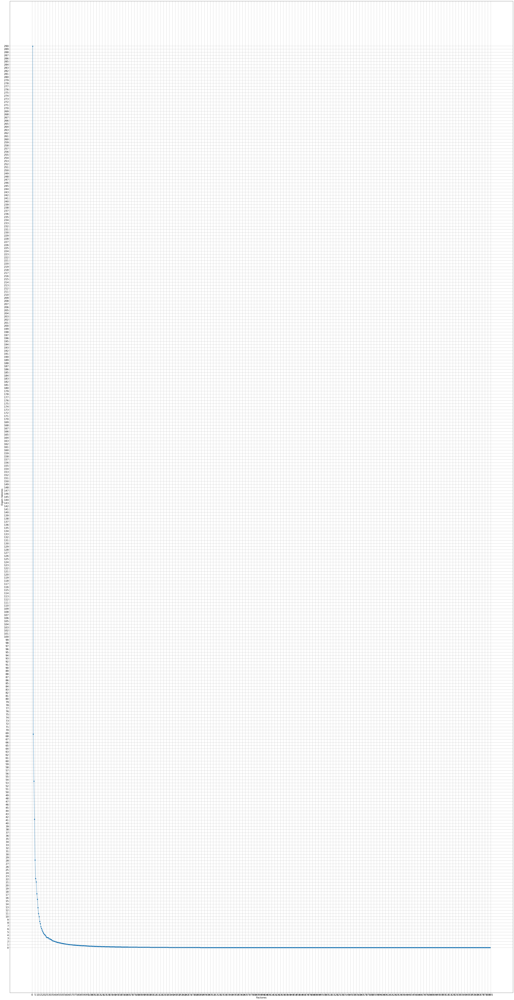

In [ ]:
fig, ax = plt.subplots(figsize=(58, 115))
ax.scatter(range(1, df.shape[1] + 1), arreglo_autovalores_ordenadodesc)
ax.plot(range(1, df.shape[1] + 1), arreglo_autovalores_ordenadodesc)

ax.set_xlabel('Factores')
ax.set_ylabel('Eigen Valores')
ax.set_xticks(ticks=np.arange(0, 790, 5))
ax.set_yticks(ticks=np.arange(0, 291, 1))
ax.grid(True)

plt.show()

**Los valores propios caen por debajo de 1 desde el factor 55. En conscuencia, el número óptimo de factores es 55.**

*Sin embargo, para comparar se usan 3 factores.*

In [132]:
analisis_factores = FactorAnalyzer(rotation = "varimax", n_factors = 3)

In [133]:
analisis_factores.fit(df)

FactorAnalyzer(rotation='varimax', rotation_kwargs={})

In [134]:
pd.DataFrame(analisis_factores.get_eigenvalues()[0], columns=['Valores Propios'])

,Valores Propios
0,289.929676
1,68.664747
2,53.527949
3,41.288644
4,28.169070
...,...
779,0.000037
780,0.000036
781,0.000036
782,0.000035


In [135]:
df.head(1)

,pixel1,pixel10,pixel100,pixel101,pixel102,pixel103,pixel104,pixel105,pixel106,pixel107,pixel108,pixel109,pixel11,pixel110,pixel111,pixel112,pixel113,pixel114,pixel115,pixel116,pixel117,pixel118,pixel119,pixel12,pixel120,pixel121,pixel122,pixel123,pixel124,pixel125,pixel126,pixel127,pixel128,pixel129,pixel13,pixel130,pixel131,pixel132,pixel133,pixel134,pixel135,pixel136,pixel137,pixel138,pixel139,pixel14,pixel140,pixel141,pixel142,pixel143,pixel144,pixel145,pixel146,pixel147,pixel148,pixel149,pixel15,pixel150,pixel151,pixel152,pixel153,pixel154,pixel155,pixel156,pixel157,pixel158,pixel159,pixel16,pixel160,pixel161,pixel162,pixel163,pixel164,pixel165,pixel166,pixel167,pixel168,pixel169,pixel17,pixel170,pixel171,pixel172,pixel173,pixel174,pixel175,pixel176,pixel177,pixel178,pixel179,pixel18,pixel180,pixel181,pixel182,pixel183,pixel184,pixel185,pixel186,pixel187,pixel188,pixel189,pixel19,pixel190,pixel191,pixel192,pixel193,pixel194,pixel195,pixel196,pixel197,pixel198,pixel199,pixel2,pixel20,pixel200,pixel201,pixel202,pixel203,pixel204,pixel205,pixel206,pixel207,pixel208,pixel209,pixel21,pixel210,pixel211,pixel212,pixel213,pixel214,pixel215,pixel216,pixel217,pixel218,pixel219,pixel22,pixel220,pixel221,pixel222,pixel223,pixel224,pixel225,pixel226,pixel227,pixel228,pixel229,pixel23,pixel230,pixel231,pixel232,pixel233,pixel234,pixel235,pixel236,pixel237,pixel238,pixel239,pixel24,pixel240,pixel241,pixel242,pixel243,pixel244,pixel245,pixel246,pixel247,pixel248,pixel249,pixel25,pixel250,pixel251,pixel252,pixel253,pixel254,pixel255,pixel256,pixel257,pixel258,pixel259,pixel26,pixel260,pixel261,pixel262,pixel263,pixel264,pixel265,pixel266,pixel267,pixel268,pixel269,pixel27,pixel270,pixel271,pixel272,pixel273,pixel274,pixel275,pixel276,pixel277,pixel278,pixel279,pixel28,pixel280,pixel281,pixel282,pixel283,pixel284,pixel285,pixel286,pixel287,pixel288,pixel289,pixel29,pixel290,pixel291,pixel292,pixel293,pixel294,pixel295,pixel296,pixel297,pixel298,pixel299,pixel3,pixel30,pixel300,pixel301,pixel302,pixel303,pixel304,pixel305,pixel306,pixel307,pixel308,pixel309,pixel31,pixel310,pixel311,pixel312,pixel313,pixel314,pixel315,pixel316,pixel317,pixel318,pixel319,pixel32,pixel320,pixel321,pixel322,pixel323,pixel324,pixel325,pixel326,pixel327,pixel328,pixel329,pixel33,pixel330,pixel331,pixel332,pixel333,pixel334,pixel335,pixel336,pixel337,pixel338,pixel339,pixel34,pixel340,pixel341,pixel342,pixel343,pixel344,pixel345,pixel346,pixel347,pixel348,pixel349,pixel35,pixel350,pixel351,pixel352,pixel353,pixel354,pixel355,pixel356,pixel357,pixel358,pixel359,pixel36,pixel360,pixel361,pixel362,pixel363,pixel364,pixel365,pixel366,pixel367,pixel368,pixel369,pixel37,pixel370,pixel371,pixel372,pixel373,pixel374,pixel375,pixel376,pixel377,pixel378,pixel379,pixel38,pixel380,pixel381,pixel382,pixel383,pixel384,pixel385,pixel386,pixel387,pixel388,pixel389,pixel39,pixel390,pixel391,pixel392,pixel393,pixel394,pixel395,pixel396,pixel397,pixel398,pixel399,pixel4,pixel40,pixel400,pixel401,pixel402,pixel403,pixel404,pixel405,pixel406,pixel407,pixel408,pixel409,pixel41,pixel410,pixel411,pixel412,pixel413,pixel414,pixel415,pixel416,pixel417,pixel418,pixel419,pixel42,pixel420,pixel421,pixel422,pixel423,pixel424,pixel425,pixel426,pixel427,pixel428,pixel429,pixel43,pixel430,pixel431,pixel432,pixel433,pixel434,pixel435,pixel436,pixel437,pixel438,pixel439,pixel44,pixel440,pixel441,pixel442,pixel443,pixel444,pixel445,pixel446,pixel447,pixel448,pixel449,pixel45,pixel450,pixel451,pixel452,pixel453,pixel454,pixel455,pixel456,pixel457,pixel458,pixel459,pixel46,pixel460,pixel461,pixel462,pixel463,pixel464,pixel465,pixel466,pixel467,pixel468,pixel469,pixel47,pixel470,pixel471,pixel472,pixel473,pixel474,pixel475,pixel476,pixel477,pixel478,pixel479,pixel48,pixel480,pixel481,pixel482,pixel483,pixel484,pixel485,pixel486,pixel487,pixel488,pixel489,pixel49,pixel490,pixel491,pixel492,pixel493,pixel494,pixel495,pixel496,pixel497,pixel498,pixel499,pixel5,pixel50,pixel500,pixel501,pixel502,pixel503,

## **Cargas**

In [136]:
import seaborn as sns
cm = sns.light_palette("blue", as_cmap=True)

In [137]:
cargas = pd.DataFrame(analisis_factores.loadings_, index = df.columns).style.background_gradient(cmap = cm)

In [143]:
cargas

,0,1,2
pixel1,0.900142,0.166585,0.112339
pixel10,0.788619,0.484502,0.125289
pixel100,0.403647,0.613208,-0.066901
pixel101,0.344043,0.633718,-0.081717
pixel102,0.323345,0.583150,-0.066488
pixel103,0.321553,0.591680,-0.023505
pixel104,0.294349,0.647763,-0.010353
pixel105,0.308169,0.674570,0.010439
pixel106,0.380058,0.682648,0.075394
pixel107,0.354549,0.695025,0.132356


## **Diferencias (52.4 %)**

In [144]:
analisis_factores.get_factor_variance()

(array([177.36368037, 157.62193133,  75.91968834]),
 array([0.22622918, 0.20104838, 0.09683634]),
 array([0.22622918, 0.42727757, 0.5241139 ]))

In [145]:
diferencia = pd.DataFrame(analisis_factores.get_factor_variance(), index=['Varianza Total Explicada por Factor','Varianza Proporcional','Varianza Proporcional Acumulada'])

In [146]:
diferencia

,0,1,2
Varianza Total Explicada por Factor,177.363680,157.621931,75.919688
Varianza Proporcional,0.226229,0.201048,0.096836
Varianza Proporcional Acumulada,0.226229,0.427278,0.524114


**Los 3 factores juntos explican el 52.41 % de la varianza total.**

## **Comunidades**

In [141]:
comunidades = pd.DataFrame(analisis_factores.get_uniquenesses(), index = df.columns, columns = ['Unicidad'])

In [148]:
comunidades_ordenadas_desc = comunidades.sort_values(by='Unicidad', ascending=False)

In [149]:
comunidades_ordenadas_desc

,Unicidad
pixel764,0.830047
pixel354,0.818470
pixel355,0.817180
pixel765,0.815410
pixel763,0.811562
...,...
pixel33,0.069617
pixel199,0.066325
pixel227,0.065816
pixel283,0.063520


**Aproximadamente, el 83.0 % de la varianza de la variable "pixel764"  es explicada por todos los tres factores juntos.**

# CONCLUSIONES

**Técnicas:**

* Varianza Explicada:
  * PCA. 3 componentes representan 52.57 %.
  * AF. 3 componentes representan 52.41 %.
* Visualización:
  * ICA.

**La técnica ganadora es PCA.**

# **F I N**